# Importing libraries

In [1]:
import pandas as pd
pd.options.display.max_colwidth=150   ## this is used to set the column width.

## Note: Other available must know options are:
# pd.options.display.max_rows=x  ## controls the max rows to be displayed on screen
# pd.options.display.max_columns=x  ## controls the max columns to be displayed on screen
# pd.options.display.precision=x  ## controls the precision of each floating points to be displayed on screen
# pd.options.display.float_format = '{:.2f}%'.format  ## controls the format of displaying numbers on screen. 
                                                      ## For eg.{$(:,.2f)} can be used for currency

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight') ## Setting the Style
import seaborn as sns

import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo

## For Preprocessing: 
from sklearn.compose import ColumnTransformer,make_column_selector
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score, RepeatedKFold,RepeatedStratifiedKFold
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
# from sklearn.base import TransformerMixin,BaseEstimator
## For making sample data:
from sklearn.datasets import make_classification

from sklearn.feature_selection import VarianceThreshold

## Using imblearn library:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

## Using msno Library for Missing Value analysis:
import missingno as msno

## For Metrics:
from sklearn.metrics import plot_precision_recall_curve,accuracy_score,matthews_corrcoef
from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.metrics import plot_confusion_matrix, confusion_matrix, classification_report
from sklearn.model_selection import learning_curve

## For Machine Learning Models:
from sklearn.linear_model import LogisticRegression,LinearRegression
from sklearn.neighbors import KNeighborsClassifier,KNeighborsRegressor
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

## For Pickling:
import pickle

import os
import io
import requests
import time
import warnings
warnings.filterwarnings("ignore")
from IPython.display import Image

In [2]:
df = pd.read_csv(r"C:\Users\asus\Desktop\credit risk\credit_risk_dataset.csv", skipinitialspace = True)
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [3]:
x = df.drop(labels = ["loan_status"], axis = 1)
y = df["loan_status"]

df_num = df.select_dtypes(include='number')
df_cat = df.select_dtypes(include=['object','category'])

In [4]:
df.shape[0],df.shape[1]

(32581, 12)

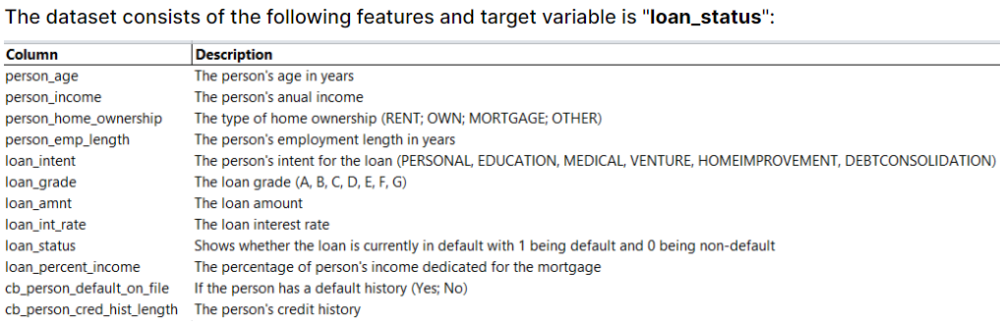

In [5]:
# Path to the image file
image_path = r"C:\Users\asus\Desktop\credit risk\Credit Risk Dataset description.png"

# Display the image
Image(filename=image_path)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [7]:
df.describe([0.05, 0.10, 0.25, 0.50, 0.75, 0.80, 0.90, 0.95, 0.99]).T

,count,mean,std,min,5%,10%,25%,50%,75%,80%,90%,95%,99%,max
person_age,32581.0,27.734600,6.348078,20.00,22.00,22.00,23.00,26.00,30.00,32.00,36.000,40.00,50.00,144.00
person_income,32581.0,66074.848470,61983.119168,4000.00,22880.00,28590.00,38500.00,55000.00,79200.00,86000.00,110004.000,138000.00,225200.00,6000000.00
person_emp_length,31686.0,4.789686,4.142630,0.00,0.00,0.00,2.00,4.00,7.00,8.00,10.000,13.00,18.00,123.00
loan_amnt,32581.0,9589.371106,6322.086646,500.00,2000.00,3000.00,5000.00,8000.00,12200.00,14500.00,19000.000,24000.00,29800.00,35000.00
loan_int_rate,29465.0,11.011695,3.240459,5.42,6.03,6.91,7.90,10.99,13.47,13.92,15.298,16.32,18.62,23.22
loan_status,32581.0,0.218164,0.413006,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.000,1.00,1.00,1.00
loan_percent_income,32581.0,0.170203,0.106782,0.00,0.04,0.05,0.09,0.15,0.23,0.25,0.320,0.38,0.50,0.83
cb_person_cred_hist_length,32581.0,5.804211,4.055001,2.00,2.00,2.00,3.00,4.00,8.00,9.00,11.000,14.00,17.00,30.00


In [8]:
## Checking for Duplicates
dups = df.duplicated()
dups.value_counts() #There are 165 Duplicated rows

False    32416
True       165
dtype: int64

In [9]:
## Removing the Duplicates
print(f"Shape of Data before removing duplicates -----> ({df.shape[0]},{df.shape[1]}) \n")
df.drop_duplicates(inplace=True)
print(f"Shape of Data after removing duplicates -----> ({df.shape[0]},{df.shape[1]})")

Shape of Data before removing duplicates -----> (32581,12) 

Shape of Data after removing duplicates -----> (32416,12)


In [10]:
ccol=df.select_dtypes(include=["object"]).columns
ncol=df.select_dtypes(include=["int","float"]).columns

print("The number of Categorical columns are:",len(ccol))
print("The number of Numerical columns are:",len(ncol))

The number of Categorical columns are: 4
The number of Numerical columns are: 8


In [11]:
print("The NUMERICAL columns are:\n")
for i in ncol:
    print("->",i,"-",df[i].nunique())
    
print("\n---------------------------\n")
print("The CATEGORICAL columns are:\n")
for i in ccol:
    print("->",i,"-",df[i].nunique())

The NUMERICAL columns are:

-> person_age - 58
-> person_income - 4295
-> person_emp_length - 36
-> loan_amnt - 753
-> loan_int_rate - 348
-> loan_status - 2
-> loan_percent_income - 77
-> cb_person_cred_hist_length - 29

---------------------------

The CATEGORICAL columns are:

-> person_home_ownership - 4
-> loan_intent - 6
-> loan_grade - 7
-> cb_person_default_on_file - 2


In [12]:
df.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_default_on_file', 'cb_person_cred_hist_length'],
      dtype='object')

# Target Variable

In [13]:
df['loan_status'].describe()

count    32416.000000
mean         0.218688
std          0.413363
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: loan_status, dtype: float64

In [14]:
df["loan_status"].value_counts() / len(df) * 100

0    78.13117
1    21.86883
Name: loan_status, dtype: float64

In [15]:
df["loan_status"].value_counts(normalize=True)

0    0.781312
1    0.218688
Name: loan_status, dtype: float64

In [16]:
ex.pie(df, names="loan_status", title = "Loan Status proportion", hole = 0.33)

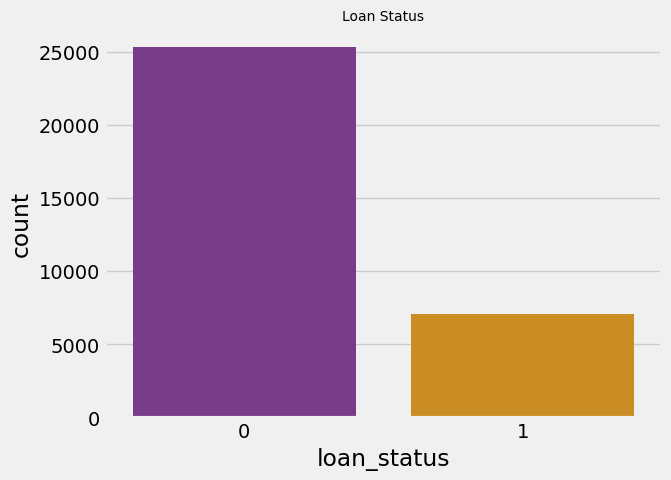

<Figure size 400x200 with 0 Axes>

In [17]:
sns.countplot(data = df, x = df.loan_status, palette='CMRmap')
plt.title("Loan Status",fontsize=10)
plt.figure(figsize=(4, 2))
plt.show()

Text(0, 0.5, 'Loan Percent Income')

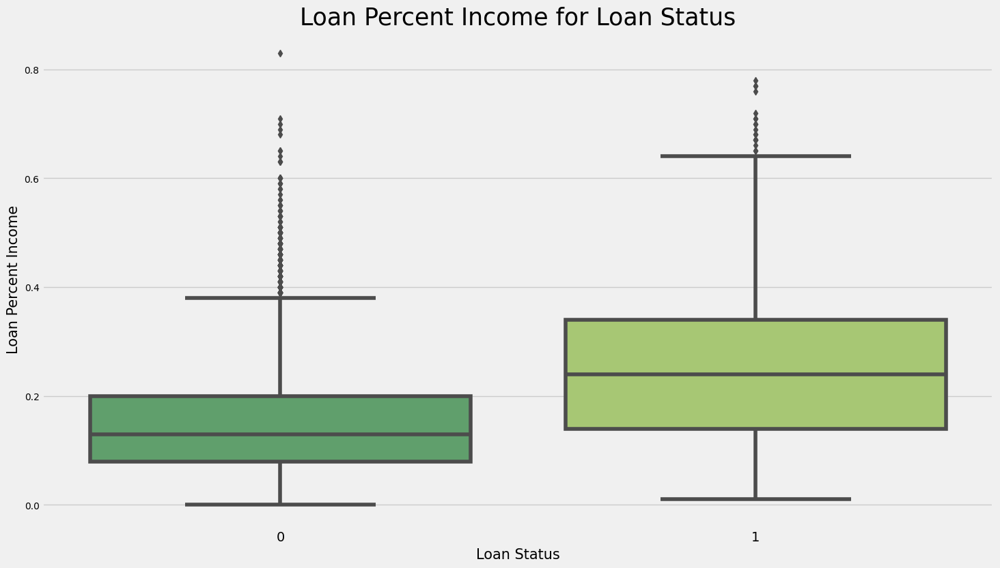

In [18]:
x = df[["loan_status", "loan_percent_income"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "loan_status", y = "loan_percent_income", data = x, palette = 'summer');

plt.title('Loan Percent Income for Loan Status', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Loan Status", fontsize = 15)
plt.ylabel("Loan Percent Income", fontsize = 15)

In [19]:
cor_target = df.corrwith(df["loan_status"])
cor_target.sort_values(axis = 0, ascending = False)

loan_status                   1.000000
loan_percent_income           0.379697
loan_int_rate                 0.335853
loan_amnt                     0.105736
cb_person_cred_hist_length   -0.016498
person_age                   -0.022698
person_emp_length            -0.082817
person_income                -0.145005
dtype: float64

# Categorical Variables

In [20]:
df.describe(include = "O").T

,count,unique,top,freq
person_home_ownership,32416,4,RENT,16378
loan_intent,32416,6,EDUCATION,6411
loan_grade,32416,7,A,10703
cb_person_default_on_file,32416,2,N,26686


In [21]:
df.select_dtypes(include=['object','category']).columns.tolist()

df_cat = df.select_dtypes(include=['object','category'])
df_cat.count()

person_home_ownership        32416
loan_intent                  32416
loan_grade                   32416
cb_person_default_on_file    32416
dtype: int64

In [22]:
ex.pie(df,names='person_home_ownership',title='Propotion Of Person Home Ownership',hole=0.33)

In [23]:
ex.pie(df,names='loan_intent',title='Propotion Of Loan Intent',hole=0.33)

In [24]:
ex.pie(df,names='loan_grade',title='Propotion Of Loan Grade',hole=0.33)

In [25]:
ex.pie(df,names='cb_person_default_on_file',title='Propotion Of CB Person Default On File',hole=0.33)

In [26]:
cat_col = ["person_home_ownership", "loan_intent", "loan_grade", "cb_person_default_on_file"]
df[cat_col].mode()

,person_home_ownership,loan_intent,loan_grade,cb_person_default_on_file
0,RENT,EDUCATION,A,N


<AxesSubplot: xlabel='cb_person_default_on_file', ylabel='count'>

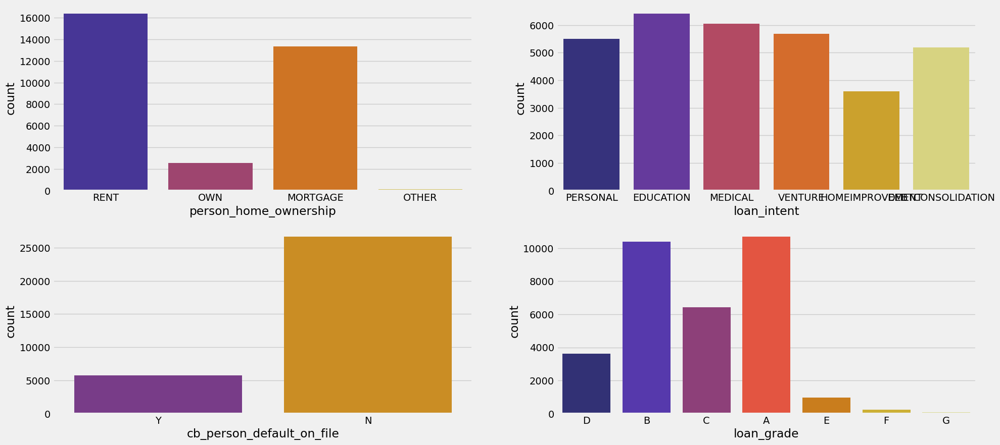

In [27]:
fig,axes = plt.subplots(2,2, figsize=(21,10))

sns.countplot(x = 'person_home_ownership',data=df,ax=axes[0,0],palette='CMRmap')
sns.countplot(x = 'loan_intent',data=df,ax=axes[0,1],palette='CMRmap')
sns.countplot(x = 'loan_grade',data=df,ax=axes[1,1],palette='CMRmap')
sns.countplot(x = 'cb_person_default_on_file',data=df,ax=axes[1,0],palette='CMRmap')

<AxesSubplot: xlabel='cb_person_default_on_file', ylabel='count'>

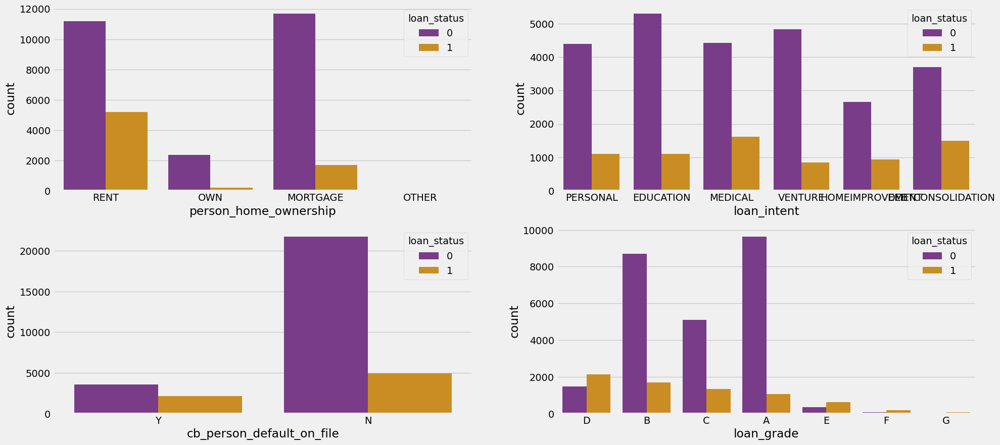

In [28]:
fig,axes = plt.subplots(2,2, figsize=(21,10))

sns.countplot(x = 'person_home_ownership',hue="loan_status",data=df,ax=axes[0,0],palette='CMRmap')
sns.countplot(x = 'loan_intent',data=df,hue="loan_status",ax=axes[0,1],palette='CMRmap')
sns.countplot(x = 'loan_grade',data=df,hue="loan_status",ax=axes[1,1],palette='CMRmap')
sns.countplot(x = 'cb_person_default_on_file',hue="loan_status",data=df,ax=axes[1,0],palette='CMRmap')

# Statistics

In [29]:
df_num.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
person_age,32581.0,27.73,6.35,20.00,23.00,26.00,30.00,144.00
person_income,32581.0,66074.85,61983.12,4000.00,38500.00,55000.00,79200.00,6000000.00
person_emp_length,31686.0,4.79,4.14,0.00,2.00,4.00,7.00,123.00
loan_amnt,32581.0,9589.37,6322.09,500.00,5000.00,8000.00,12200.00,35000.00
loan_int_rate,29465.0,11.01,3.24,5.42,7.90,10.99,13.47,23.22
loan_status,32581.0,0.22,0.41,0.00,0.00,0.00,0.00,1.00
loan_percent_income,32581.0,0.17,0.11,0.00,0.09,0.15,0.23,0.83
cb_person_cred_hist_length,32581.0,5.80,4.06,2.00,3.00,4.00,8.00,30.00


In [30]:
## Checking for Missing values:
df.isnull().any()

person_age                    False
person_income                 False
person_home_ownership         False
person_emp_length              True
loan_intent                   False
loan_grade                    False
loan_amnt                     False
loan_int_rate                  True
loan_status                   False
loan_percent_income           False
cb_person_default_on_file     False
cb_person_cred_hist_length    False
dtype: bool

In [31]:
df.isna().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              887
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3095
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

In [32]:
percent_missing = (df.isnull().sum().sort_values(ascending = False) * 100 / len(df)).round(2)
percent_missing

loan_int_rate                 9.55
person_emp_length             2.74
person_age                    0.00
person_income                 0.00
person_home_ownership         0.00
loan_intent                   0.00
loan_grade                    0.00
loan_amnt                     0.00
loan_status                   0.00
loan_percent_income           0.00
cb_person_default_on_file     0.00
cb_person_cred_hist_length    0.00
dtype: float64

<AxesSubplot: >

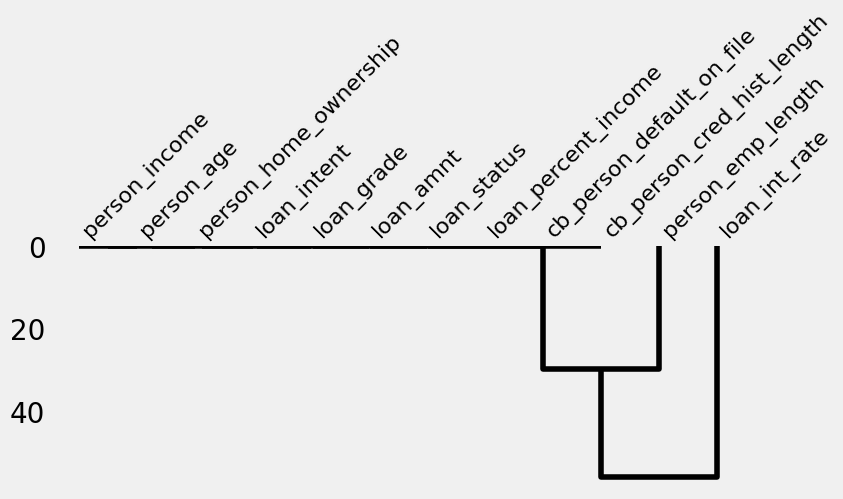

In [33]:
msno.dendrogram(df, figsize = (8, 3))

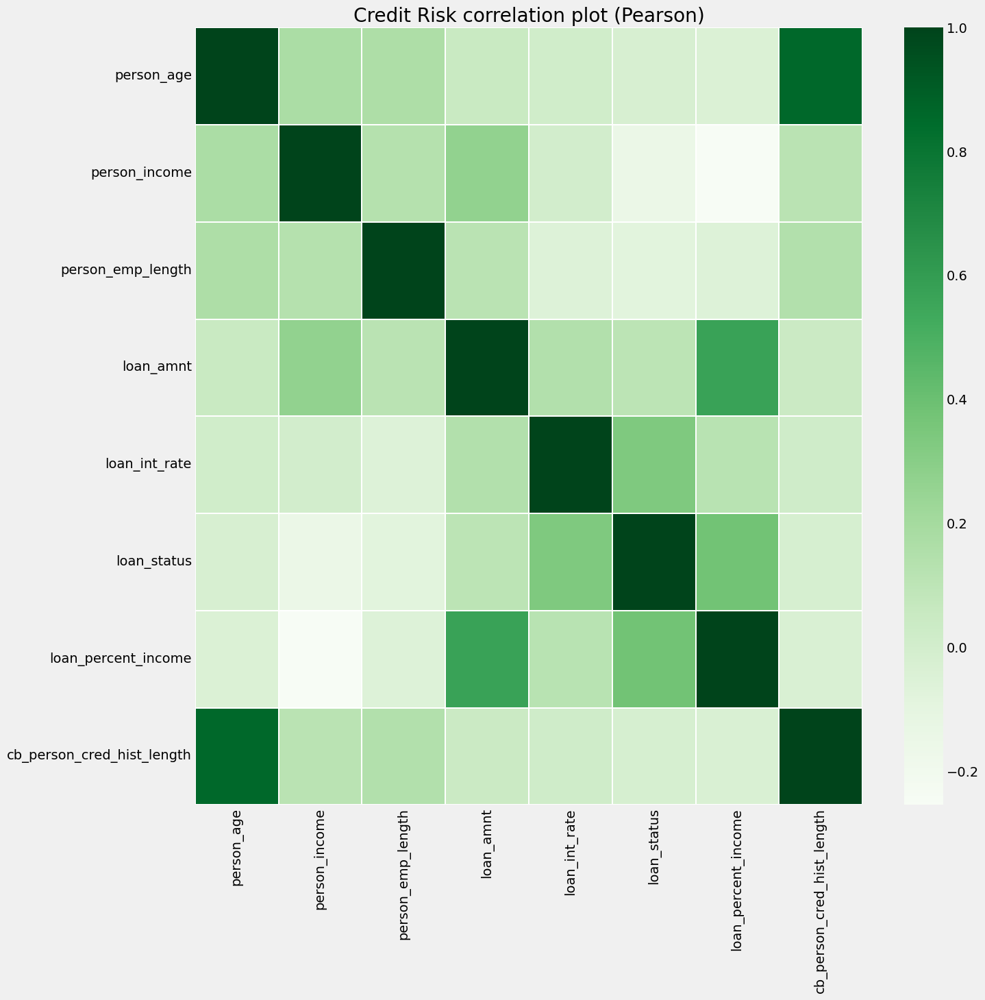

In [34]:
plt.figure(figsize = (14,14))
plt.title('Credit Risk correlation plot (Pearson)')
corr = df.corr()
sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,linewidths=.1,cmap="Greens")
plt.show()

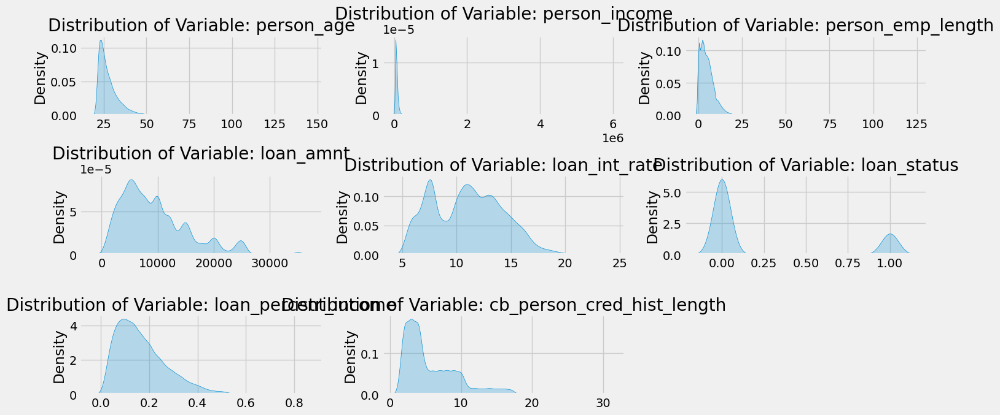

In [35]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 7), sharex = False, sharey = False)
axes = axes.ravel()  
cols = df_num.columns[:]

for col, ax in zip(cols, axes):
    data = df_num 
    sns.kdeplot(data=data, x=col, shade=True, ax=ax)
    ax.set(title=f'Distribution of Variable: {col}', xlabel=None)
    
fig.delaxes(axes[8])
fig.tight_layout()
plt.show()

In [36]:
df_num.skew()

person_age                     2.581393
person_income                 32.865349
person_emp_length              2.614455
loan_amnt                      1.192477
loan_int_rate                  0.208550
loan_status                    1.364888
loan_percent_income            1.064669
cb_person_cred_hist_length     1.661790
dtype: float64

In [37]:
df_num.kurtosis()

person_age                      18.560825
person_income                 2693.272776
person_emp_length               43.722338
loan_amnt                        1.423565
loan_int_rate                   -0.671609
loan_status                     -0.137088
loan_percent_income              1.223687
cb_person_cred_hist_length       3.716194
dtype: float64

In [38]:
constant_selector= VarianceThreshold(threshold = 0)
constant_selector.fit(df_num)

VarianceThreshold(threshold=0)

In [39]:
constant_selector.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True])

In [40]:
sum(constant_selector.get_support())

8

In [41]:
constant_columns = [column for column in df_num.columns
                    if column not in df_num.columns[constant_selector.get_support()]]

print(len(constant_columns))

0


In [42]:
quasi_constant_selector = VarianceThreshold(threshold = 0.01) 

quasi_constant_selector.fit(df_num)

VarianceThreshold(threshold=0.01)

In [43]:
quasi_constant_selector.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True])

In [44]:
quasi_constant_columns = [column for column in df_num.columns
                    if column not in df_num.columns[quasi_constant_selector.get_support()]]

print(len(quasi_constant_columns))

0


In [45]:
percentile_25 = df_num["person_age"].quantile(0.25)
percentile_75 = df_num["person_age"].quantile(0.75)

percentile_25
percentile_75      

iqr = percentile_75 - percentile_25
iqr

upper_limit = percentile_75 + 1.5 * iqr
lower_limit = percentile_25 - 1.5 * iqr

upper_limit   
lower_limit

12.5

In [46]:
df_num[df_num["person_age"] > upper_limit]   
df_num[df_num["person_age"] < lower_limit]

IQR_outliers = df_num[(df_num.person_age <= lower_limit) | (df_num.person_age >= upper_limit)]
IQR_outliers

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
81,144,250000,4.0,4800,13.57,0,0.02,3
183,144,200000,4.0,6000,11.86,0,0.03,2
575,123,80004,2.0,20400,10.25,0,0.25,3
747,123,78000,7.0,20000,NaN,0,0.26,4
29121,50,900000,11.0,30000,12.69,0,0.03,15
...,...,...,...,...,...,...,...,...
32576,57,53000,1.0,5800,13.16,0,0.11,30
32577,54,120000,4.0,17625,7.49,0,0.15,19
32578,65,76000,3.0,35000,10.99,1,0.46,28
32579,56,150000,5.0,15000,11.48,0,0.10,26


In [47]:
upper_bound = df_num["person_age"].quantile(0.99)  
lower_bound = df_num["person_age"].quantile(0.01)  

upper_bound, lower_bound

(50.0, 21.0)

<AxesSubplot: >

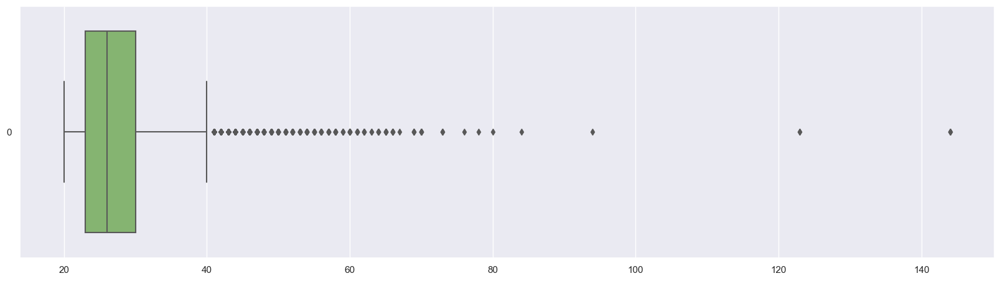

In [48]:
sns.set(rc = {"figure.figsize" : (18,5)})

sns.boxplot(df_num["person_age"], palette="summer", orient = "horizontal")

<AxesSubplot: >

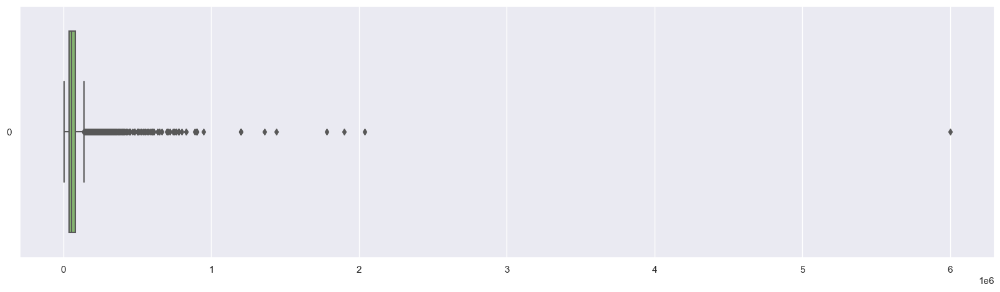

In [49]:
sns.boxplot(df_num["person_income"], palette="summer", orient = "horizontal")

<AxesSubplot: >

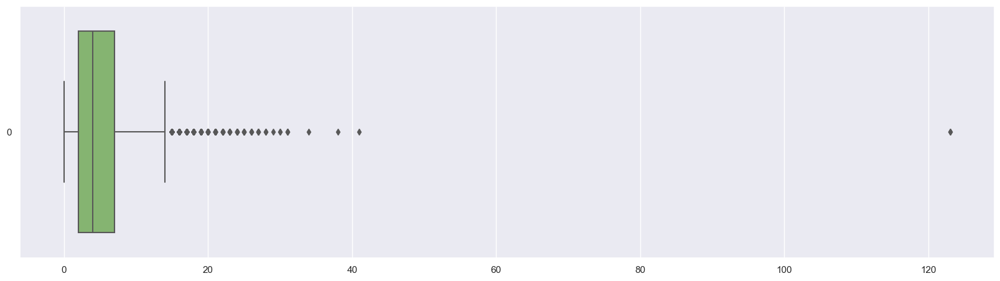

In [50]:
sns.boxplot(df_num["person_emp_length"], palette="summer", orient = "horizontal")

<AxesSubplot: >

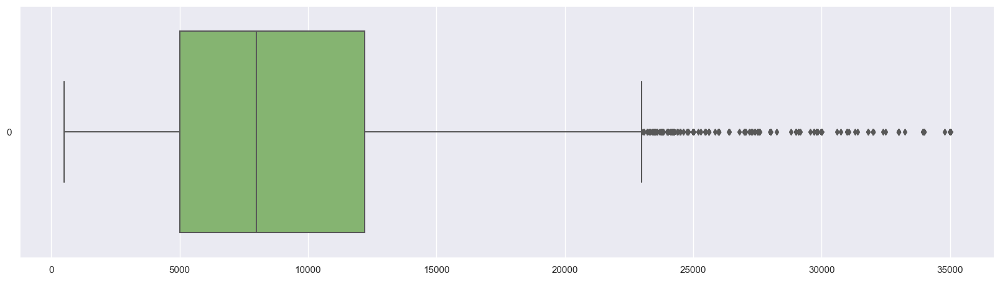

In [51]:
sns.boxplot(df_num["loan_amnt"], palette="summer", orient = "horizontal")

<AxesSubplot: >

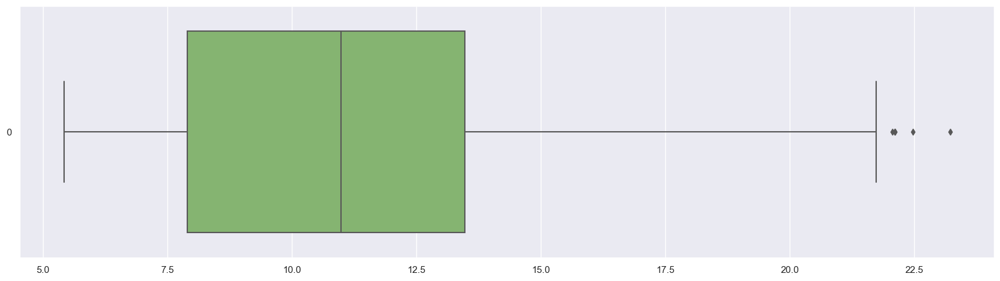

In [52]:
sns.boxplot(df_num["loan_int_rate"], palette="summer", orient = "horizontal")

<AxesSubplot: >

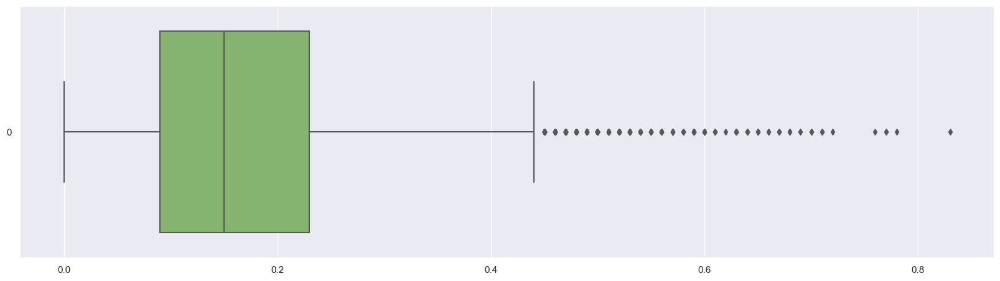

In [53]:
sns.boxplot(df_num["loan_percent_income"], palette="summer", orient = "horizontal")

<AxesSubplot: >

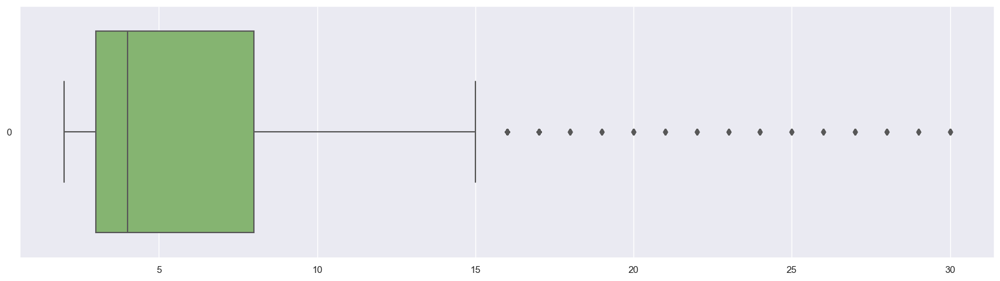

In [54]:
sns.boxplot(df_num["cb_person_cred_hist_length"],palette="summer", orient = "horizontal")

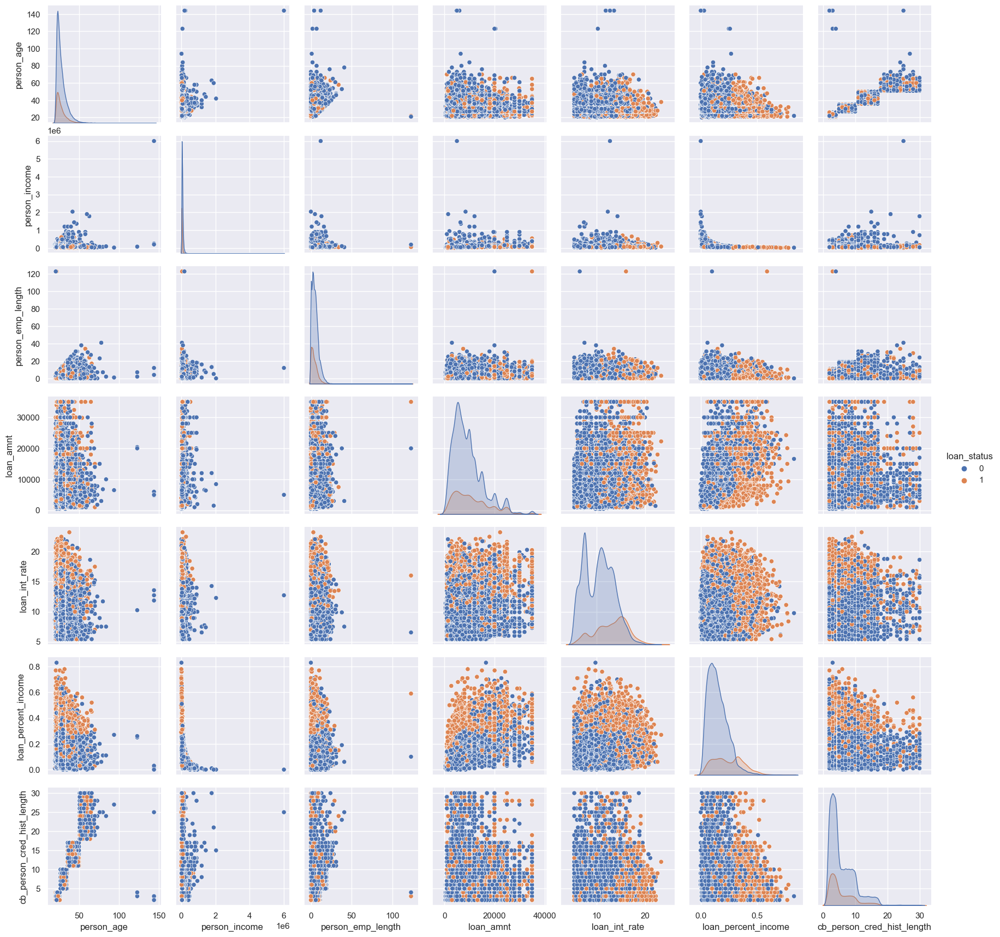

In [55]:
sns.pairplot(df_num,hue="loan_status")

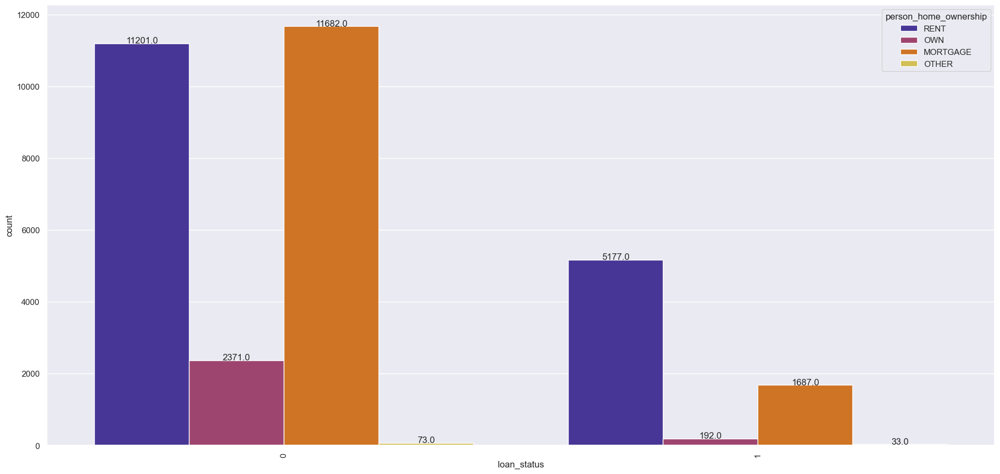

In [56]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1,x='loan_status',hue="person_home_ownership",data=df, palette="CMRmap")
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

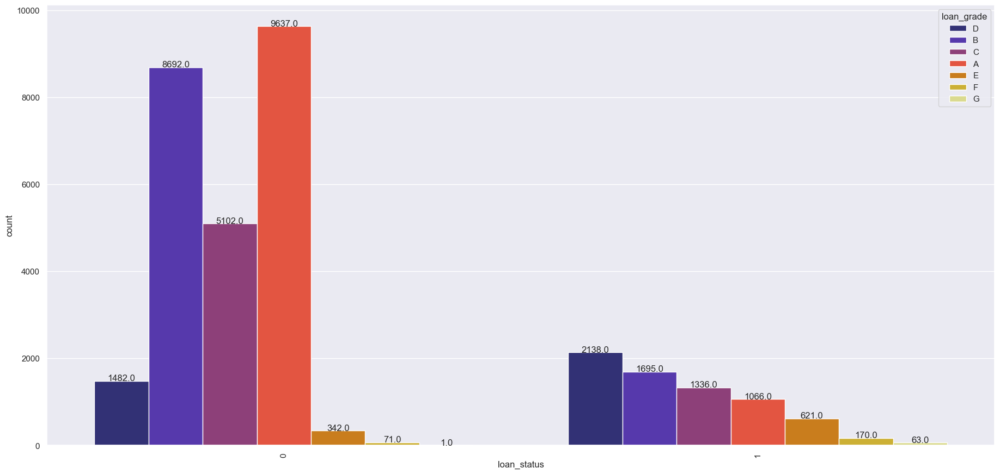

In [57]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1,x='loan_status',hue="loan_grade",data=df, palette="CMRmap")
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

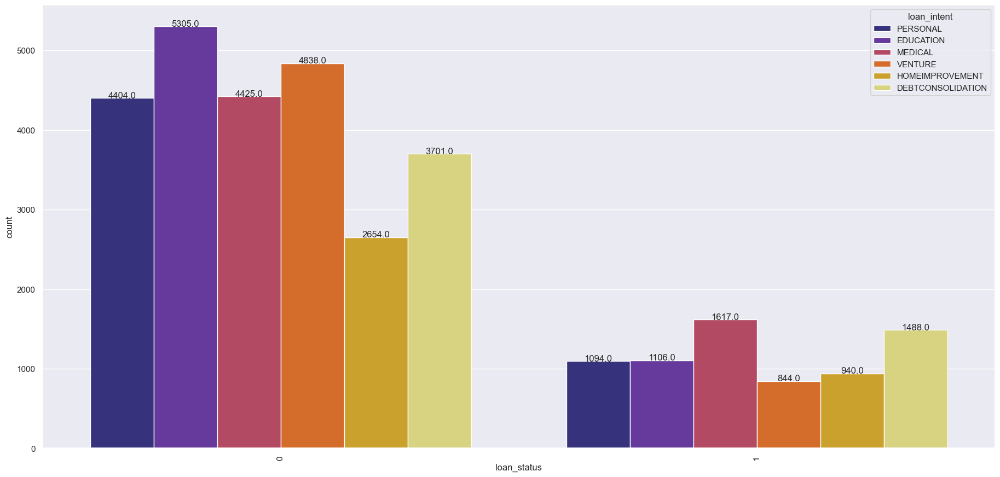

In [58]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1,x='loan_status',hue="loan_intent",data=df, palette="CMRmap")
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

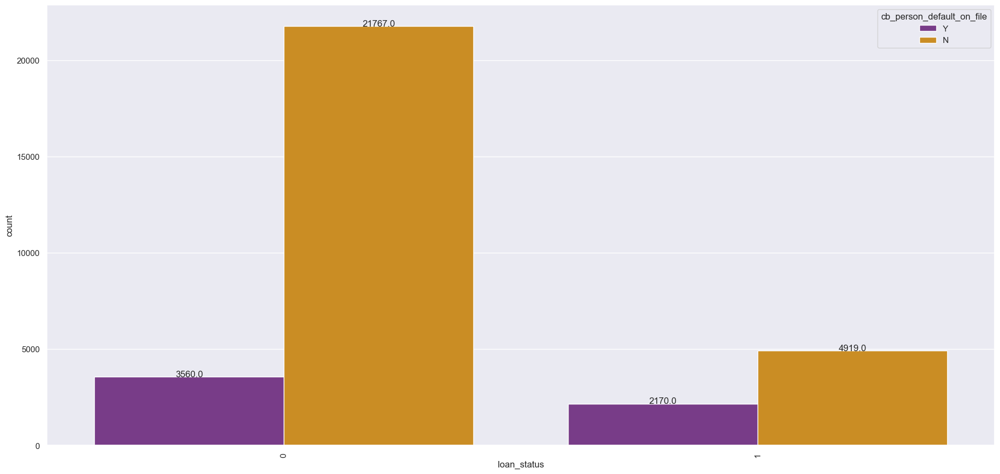

In [59]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1,x='loan_status',hue="cb_person_default_on_file",data=df, palette="CMRmap" )
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

In [60]:
cross_dei = pd.crosstab(index = df['loan_status'], columns = df['loan_percent_income'], normalize='columns').round(4) * 100

cross_dei

loan_percent_income,0.00,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,...,0.67,0.68,0.69,0.70,0.71,0.72,0.76,0.77,0.78,0.83
loan_status,,,,,,,,,,,,,,,,,,,,,
0,100.0,94.2,91.06,90.31,87.73,90.02,88.91,88.27,85.61,87.68,...,0.0,33.33,50.0,33.33,33.33,0.0,0.0,0.0,0.0,100.0
1,0.0,5.8,8.94,9.69,12.27,9.98,11.09,11.73,14.39,12.32,...,100.0,66.67,50.0,66.67,66.67,100.0,100.0,100.0,100.0,0.0


In [61]:
pd.crosstab(index = df_cat['loan_intent'], columns = df_cat['loan_grade'])

cross_index = pd.crosstab(index = df_cat['loan_intent'], columns = df_cat['loan_grade'], 
            normalize='index').round(4) * 100

cross_index

loan_grade,A,B,C,D,E,F,G
loan_intent,,,,,,,
DEBTCONSOLIDATION,33.53,31.08,20.06,11.52,2.78,0.83,0.19
EDUCATION,33.65,31.32,21.06,10.23,2.89,0.72,0.14
HOMEIMPROVEMENT,31.22,30.88,19.23,13.55,3.98,0.89,0.25
MEDICAL,32.17,33.10,20.06,10.84,2.76,0.86,0.20
PERSONAL,33.14,32.78,18.99,11.70,2.67,0.55,0.18
VENTURE,33.76,32.63,19.36,10.23,3.12,0.67,0.25


In [62]:
cross_df = pd.crosstab(index = df_cat['loan_intent'], columns = df_cat['loan_grade'], 
            margins = True, margins_name= "Total", normalize = True).round(4) * 100

cross_df

loan_grade,A,B,C,D,E,F,G,Total
loan_intent,,,,,,,,
DEBTCONSOLIDATION,5.37,4.98,3.21,1.84,0.44,0.13,0.03,16.01
EDUCATION,6.65,6.19,4.16,2.02,0.57,0.14,0.03,19.78
HOMEIMPROVEMENT,3.46,3.42,2.13,1.50,0.44,0.10,0.03,11.09
MEDICAL,6.00,6.17,3.74,2.02,0.52,0.16,0.04,18.64
PERSONAL,5.62,5.56,3.22,1.98,0.45,0.09,0.03,16.96
VENTURE,5.92,5.72,3.39,1.79,0.55,0.12,0.04,17.53
Total,33.02,32.04,19.86,11.17,2.97,0.74,0.20,100.00


In [63]:
cross_col = pd.crosstab(index = df_cat['loan_intent'], columns = df_num['loan_status'], 
            normalize='index').round(4) * 100

cross_col

loan_status,0,1
loan_intent,,
DEBTCONSOLIDATION,71.32,28.68
EDUCATION,82.75,17.25
HOMEIMPROVEMENT,73.85,26.15
MEDICAL,73.24,26.76
PERSONAL,80.10,19.90
VENTURE,85.15,14.85


In [64]:
cross_col = pd.crosstab(index = df_cat['loan_intent'], columns = df_num['loan_status'], 
            normalize='index').round(4) * 100

cross_col

loan_status,0,1
loan_intent,,
DEBTCONSOLIDATION,71.32,28.68
EDUCATION,82.75,17.25
HOMEIMPROVEMENT,73.85,26.15
MEDICAL,73.24,26.76
PERSONAL,80.10,19.90
VENTURE,85.15,14.85


In [65]:
pd.crosstab(index = df_cat['cb_person_default_on_file'], columns = df_num['loan_status'], 
            normalize='index').round(4) * 100

loan_status,0,1
cb_person_default_on_file,,
N,81.57,18.43
Y,62.13,37.87


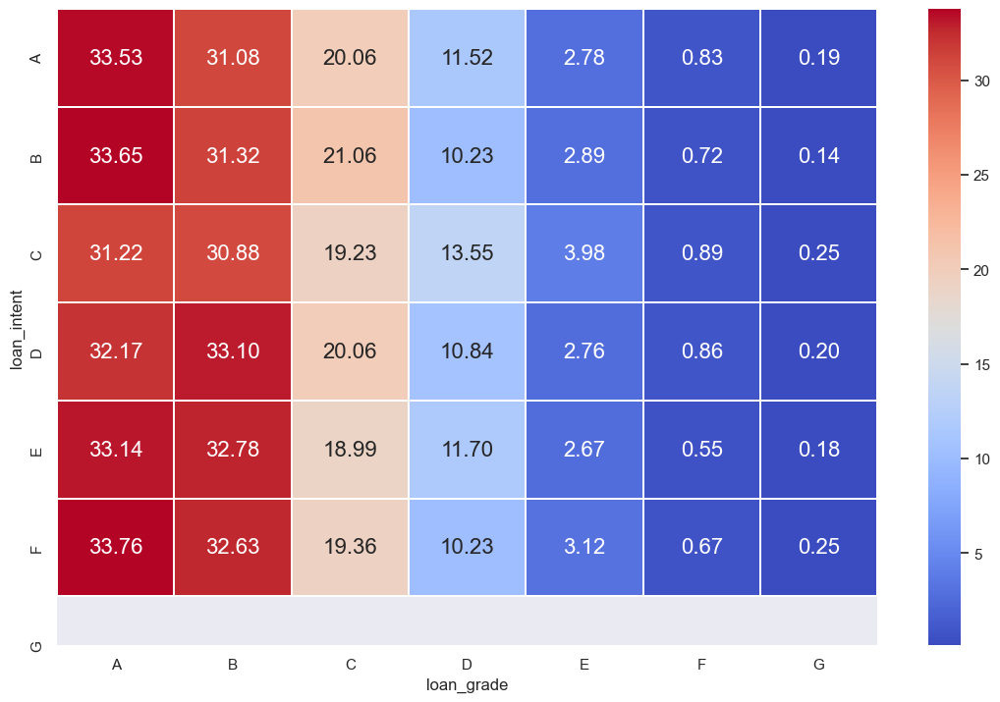

In [66]:
plt.figure(figsize=(12,8))
sns.heatmap(cross_index,xticklabels=cross_index.columns,yticklabels=cross_index.columns, cmap='coolwarm',linewidths=.1, annot=True, annot_kws={"size": 16}, fmt='.2f');

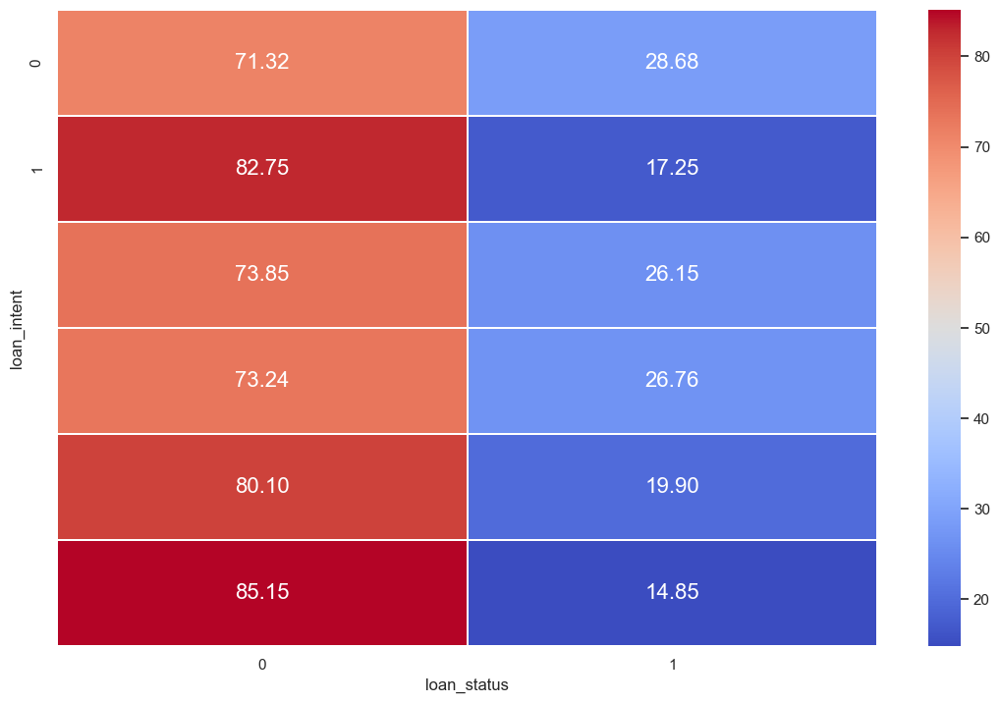

In [67]:
plt.figure(figsize=(12,8))
sns.heatmap(cross_col,xticklabels=cross_col.columns,yticklabels=cross_col.columns, cmap='coolwarm',linewidths=.1, annot=True, annot_kws={"size": 16}, fmt='.2f');

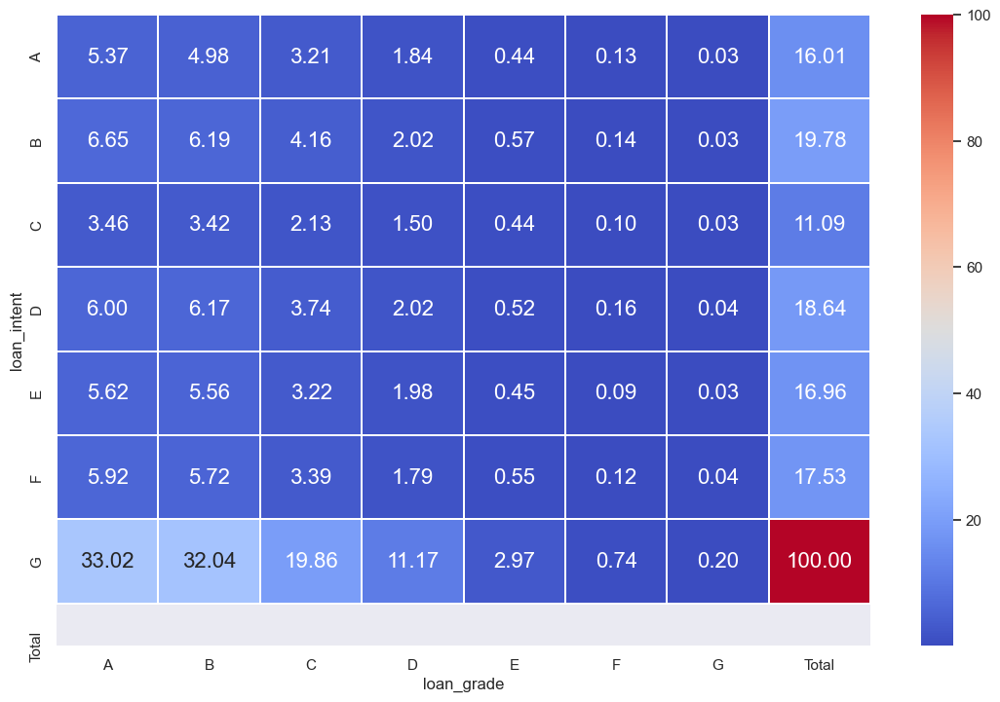

In [68]:
plt.figure(figsize=(12,8))
sns.heatmap(cross_df,xticklabels=cross_df.columns,yticklabels=cross_df.columns, cmap='coolwarm',linewidths=.1, annot=True, annot_kws={"size": 16}, fmt='.2f');

In [69]:
cross_his = pd.crosstab(index = df['cb_person_cred_hist_length'], columns = df_num['loan_status'], 
          normalize='index').round(4) * 100

cross_his

loan_status,0,1
cb_person_cred_hist_length,,
2,76.30,23.70
3,77.63,22.37
4,77.59,22.41
5,79.47,20.53
6,79.18,20.82
7,80.08,19.92
8,78.61,21.39
9,79.18,20.82
10,79.69,20.31


<AxesSubplot: xlabel='cb_person_cred_hist_length'>

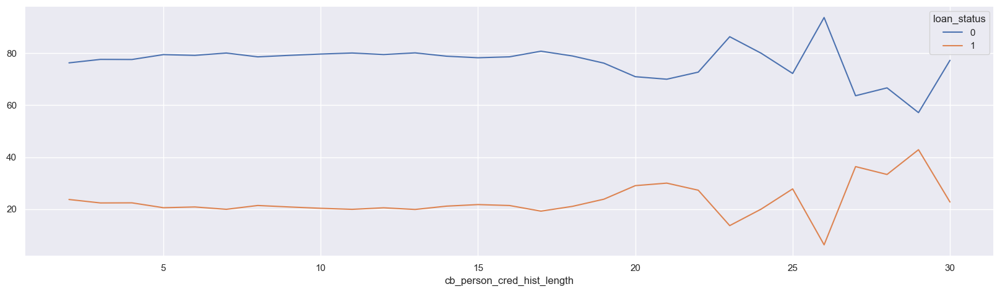

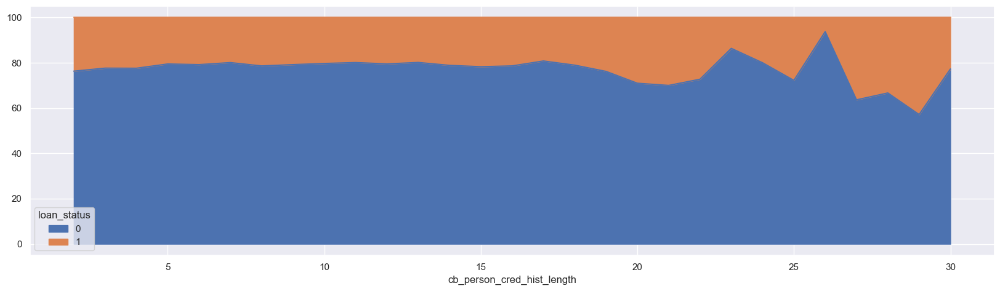

In [70]:
cross_his.plot(kind = "line")
cross_his.plot(kind = "area")

In [71]:
corr_matrix = df.corr(method = "pearson" )

corr_matrix.style.background_gradient(cmap='coolwarm')

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
person_age,1.000000,0.173293,0.163001,0.050680,0.011760,-0.022698,-0.042300,0.859215
person_income,0.173293,1.000000,0.133903,0.265947,0.000878,-0.145005,-0.254472,0.117614
person_emp_length,0.163001,0.133903,1.000000,0.113183,-0.056607,-0.082817,-0.053999,0.144889
loan_amnt,0.050680,0.265947,0.113183,1.000000,0.146937,0.105736,0.572824,0.041865
loan_int_rate,0.011760,0.000878,-0.056607,0.146937,1.000000,0.335853,0.120207,0.015896
loan_status,-0.022698,-0.145005,-0.082817,0.105736,0.335853,1.000000,0.379697,-0.016498
loan_percent_income,-0.042300,-0.254472,-0.053999,0.572824,0.120207,0.379697,1.000000,-0.031457
cb_person_cred_hist_length,0.859215,0.117614,0.144889,0.041865,0.015896,-0.016498,-0.031457,1.000000


# Categorical - Numeric

<AxesSubplot: title={'center': 'Age by Ownership'}, xlabel='person_home_ownership', ylabel='person_age'>

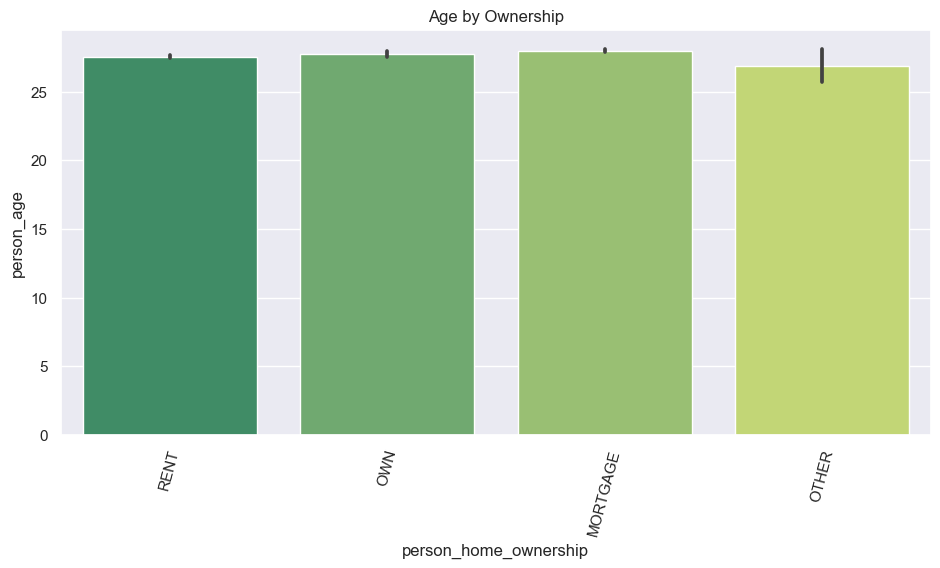

In [72]:
plt.figure(figsize=(10,5))
plt.xticks(rotation=75)
plt.title("Age by Ownership")

sns.barplot(x = df_cat["person_home_ownership"], y = df_num["person_age"], palette="summer")

<AxesSubplot: title={'center': 'Reletionship between Income and Loan Grade'}, xlabel='loan_grade', ylabel='person_income'>

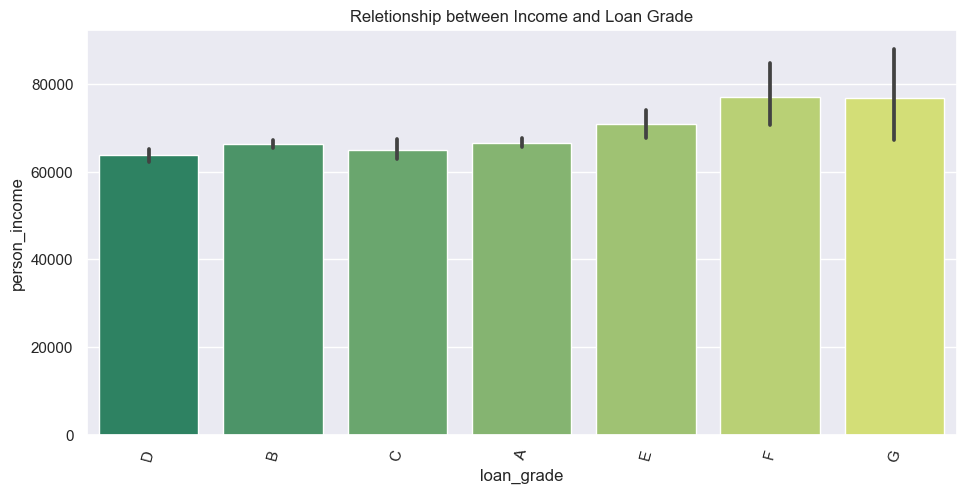

In [73]:
plt.figure(figsize=(10,5))
plt.xticks(rotation=75)
plt.title("Reletionship between Income and Loan Grade")

sns.barplot(x = df_cat["loan_grade"], y = df_num["person_income"], palette="summer")

<AxesSubplot: title={'center': 'Reletionship between Income and Previous Default'}, xlabel='cb_person_default_on_file', ylabel='person_income'>

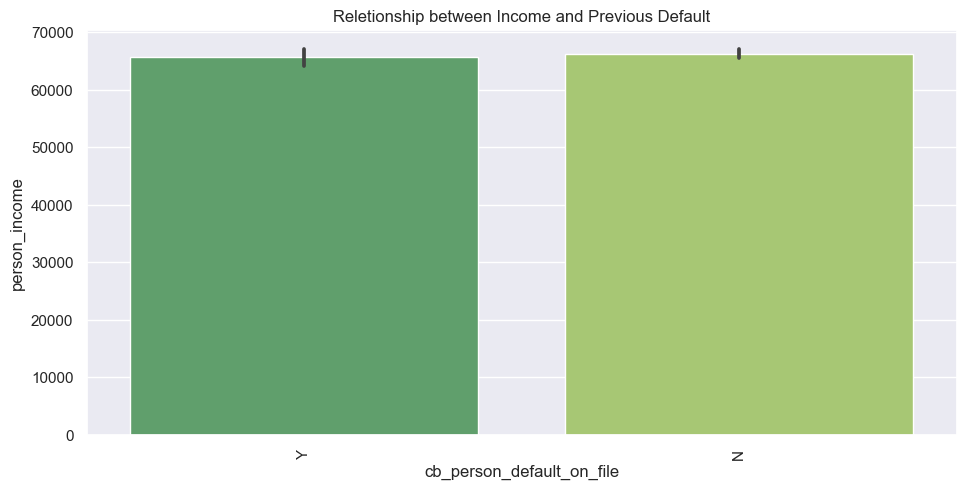

In [74]:
plt.figure(figsize=(6,3))
plt.xticks(rotation=90)
plt.title("Reletionship between Income and Previous Default")

sns.barplot(x = df_cat["cb_person_default_on_file"], y = df_num["person_income"], palette="summer")

# Classification of Loan Status

In [75]:
df.drop(['loan_int_rate'],axis=1,inplace=True)

In [76]:
df["loan_intent"].unique()

array(['PERSONAL', 'EDUCATION', 'MEDICAL', 'VENTURE', 'HOMEIMPROVEMENT',
       'DEBTCONSOLIDATION'], dtype=object)

In [77]:
df.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_status', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length'],
      dtype='object')

In [78]:
df["loan_status"].value_counts(normalize=True)

0    0.781312
1    0.218688
Name: loan_status, dtype: float64

In [79]:
## Checking for Missing values:
df.isnull().any()

person_age                    False
person_income                 False
person_home_ownership         False
person_emp_length              True
loan_intent                   False
loan_grade                    False
loan_amnt                     False
loan_status                   False
loan_percent_income           False
cb_person_default_on_file     False
cb_person_cred_hist_length    False
dtype: bool

In [80]:
df.isna().sum()

person_age                      0
person_income                   0
person_home_ownership           0
person_emp_length             887
loan_intent                     0
loan_grade                      0
loan_amnt                       0
loan_status                     0
loan_percent_income             0
cb_person_default_on_file       0
cb_person_cred_hist_length      0
dtype: int64

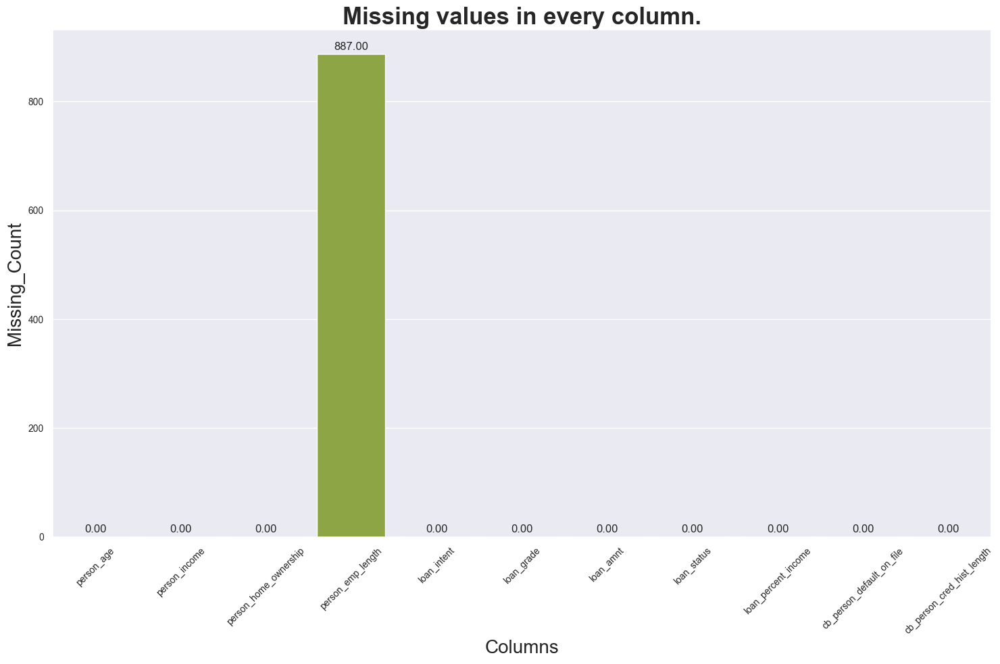

In [81]:
mn=df.isna().sum()
mn=pd.DataFrame(mn,columns=["missing_count"]).reset_index()
mn.columns=["columns_names","missing_count"]

sns.set_theme(style="darkgrid")
plt.figure(figsize=(15,10))
plots=sns.barplot(x=mn.columns_names,y=mn.missing_count)
# Iterating over the bars one-by-one
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')
plt.xticks(rotation=45) #Rotating the Label
plt.title("Missing values in every column.",size=25,weight="bold") #Title of the plot
plt.xlabel("Columns",fontsize=20) #Title of x-axis
plt.ylabel("Missing_Count",fontsize=20)
plt.tick_params(labelsize=10) #Varying label size
plt.tight_layout()

<AxesSubplot: >

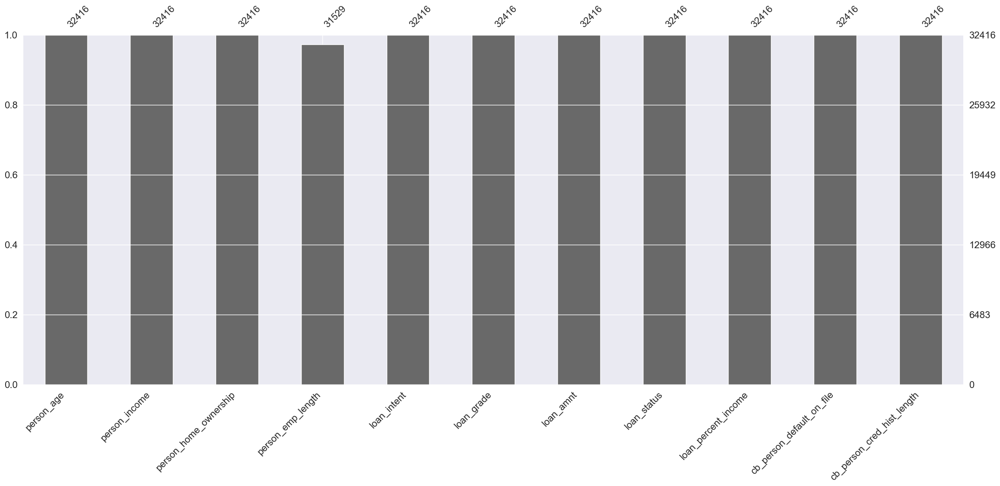

In [82]:
msno.bar(df)

<AxesSubplot: >

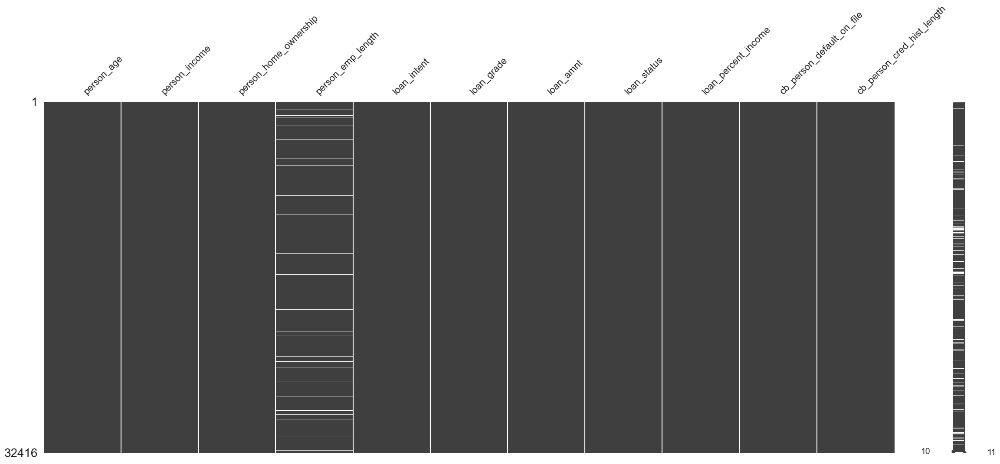

In [83]:
msno.matrix(df)

<AxesSubplot: >

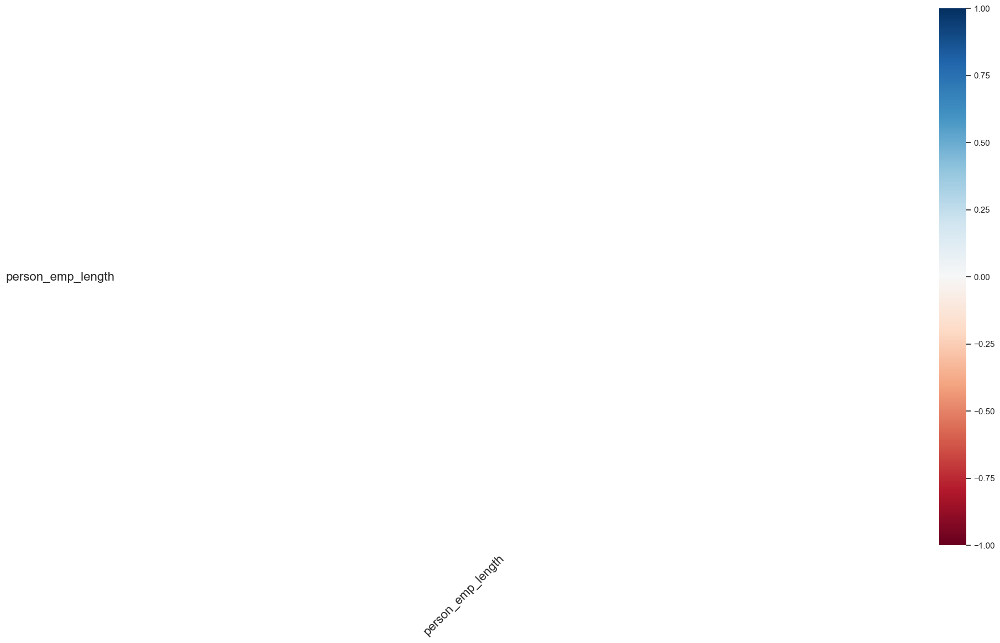

In [84]:
msno.heatmap(df)

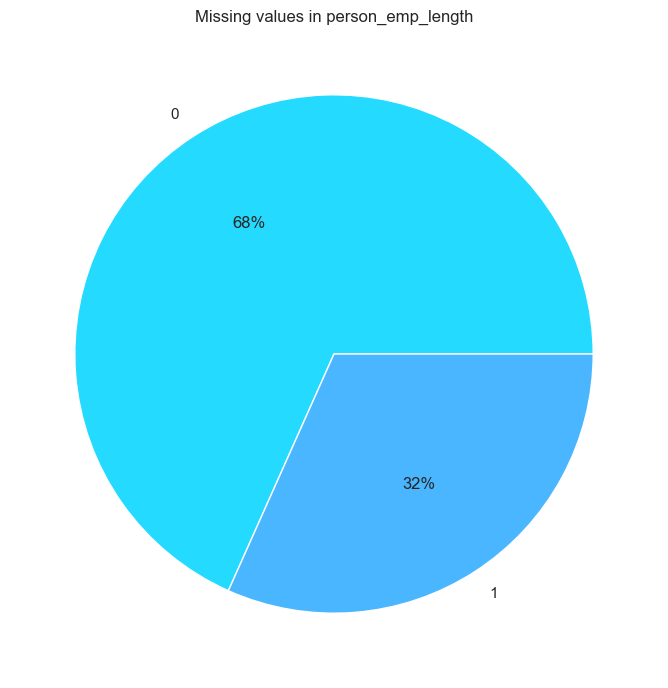

In [85]:
## Missing values in each target class:
#l=df.groupby(["loan_status"])["loan_int_rate"].apply(lambda x:x.isnull().sum())
p=df.groupby(["loan_status"])["person_emp_length"].apply(lambda x:x.isnull().sum())

fig,ax=plt.subplots(1,1,figsize=(8,8))
# ax[0].set_title("Missing values in loan_int_rate")
# ax[0].pie(l.values, labels=l.index, colors=sns.color_palette('bright'), autopct='%.0f%%')

ax.set_title("Missing values in person_emp_length")
ax.pie(p.values, labels=p.index, colors=sns.color_palette('cool'), autopct='%.0f%%')
fig.show()

In [86]:
# X and y will represent the entire training data
# X_test and y_test will be the sample data for model evaluation

X, X_test, y, y_test = train_test_split(df.drop('loan_status', axis=1), df['loan_status'],
                                        random_state=0,  test_size=0.2, stratify=df['loan_status'],
                                        shuffle=True)

In [87]:
y.value_counts(normalize=True)   #Note that the proportion remains the same because of stratify.

0    0.781313
1    0.218687
Name: loan_status, dtype: float64

In [88]:
y_test.value_counts(normalize=True)

0    0.781308
1    0.218692
Name: loan_status, dtype: float64

In [89]:
## Checking for missing values in train data:
(X.shape[0]-X.dropna().shape[0])/X.shape[0]*100
## There are 12% missing data in the train set

2.799629801018047

In [90]:
#To print the number of unique values:
for col in X:
    print(col, '--->', X[col].nunique())
    if X[col].nunique()<20:
        print(X[col].value_counts(normalize=True)*100)
    print()

person_age ---> 58

person_income ---> 3680

person_home_ownership ---> 4
RENT        50.320068
MORTGAGE    41.439149
OWN          7.916859
OTHER        0.323924
Name: person_home_ownership, dtype: float64

person_emp_length ---> 36

loan_intent ---> 6
EDUCATION            19.809502
MEDICAL              18.787598
VENTURE              17.542033
PERSONAL             16.878760
DEBTCONSOLIDATION    15.968687
HOMEIMPROVEMENT      11.013420
Name: loan_intent, dtype: float64

loan_grade ---> 7
A    32.932284
B    32.126330
C    19.902052
D    11.121394
E     3.004010
F     0.732685
G     0.181243
Name: loan_grade, dtype: float64

loan_amnt ---> 710

loan_percent_income ---> 75

cb_person_default_on_file ---> 2
N    82.392411
Y    17.607589
Name: cb_person_default_on_file, dtype: float64

cb_person_cred_hist_length ---> 29



In [91]:
X.loc[X['person_age']>=80, :]  

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
32422,80,64000,RENT,7.0,MEDICAL,B,6800,0.11,N,25
81,144,250000,RENT,4.0,VENTURE,C,4800,0.02,N,3
32416,94,24000,RENT,1.0,MEDICAL,C,6500,0.27,N,27
747,123,78000,RENT,7.0,VENTURE,B,20000,0.26,N,4
183,144,200000,MORTGAGE,4.0,EDUCATION,B,6000,0.03,N,2
575,123,80004,RENT,2.0,EDUCATION,B,20400,0.25,N,3
32506,84,94800,MORTGAGE,2.0,PERSONAL,A,10000,0.11,N,24
32297,144,6000000,MORTGAGE,12.0,PERSONAL,C,5000,0.00,N,25


In [92]:
X.shape   ## shape before removal

(25932, 10)

In [93]:
X = X.loc[X['person_age']<80, :]

In [94]:
X.shape  ## shape after removal

(25924, 10)

In [95]:
X.loc[X['person_emp_length']>=60, :]

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
210,21,192000,MORTGAGE,123.0,VENTURE,A,20000,0.10,N,4
0,22,59000,RENT,123.0,PERSONAL,D,35000,0.59,Y,3


In [96]:
X = X.loc[X['person_emp_length']<60, :]

In [97]:
# Since we've removed some data from X, we need to pass on these updations to y as well,
# as y doesn't know some of its corresponding X's have been deleted.
y = y[X.index]

In [98]:
y.value_counts()

0    19744
1     5452
Name: loan_status, dtype: int64

In [99]:
## Original Pipeline:

### 1. Creating a pipeline for numerical columns:
num_pipe = Pipeline([
    ('impute', IterativeImputer()),     #MICE (Multivariate Imputation by Chained Equations)
    ('scale', StandardScaler()),
])

### 2. Using the Column Transformer class for binding the above numeric pipeline and the preprocessing steps of categorical columns:
### Here, for keeping a list of numeric and categorical columns, I have used the make_column_selector method. You can read more about it here: https://scikit-learn.org/stable/modules/generated/sklearn.compose.make_column_selector.html

ct = ColumnTransformer([
    ('num_pipe', num_pipe, make_column_selector(dtype_include=np.number)),
    ('cat_cols', OneHotEncoder(sparse=False, handle_unknown='ignore'), make_column_selector(dtype_include=object))
], remainder='passthrough')


## Setting up the models to be tested upon and the parameters for their pipelines'::

grid = {
    XGBClassifier():
    {'model__n_estimators':[i*100 for i in range(10)],
     'model__max_depth':[6,8,10,12,14,16],
     'model__learning_rate':[0.01, 0.05, 0.1, 0.15, 0.2, 0.3],
     'coltf__num_pipe__impute__estimator':[LinearRegression(), RandomForestRegressor(random_state=0), #coltf is the name of the final 
                                        KNeighborsRegressor()]},                                      #pipeline. The base estimator of 
                                                                                                #iterative imputer is also considered
    LGBMClassifier(class_weight='balanced', random_state=0):                                          # as a parameter
    {'model__n_estimators':[300,400,500],
     'model__learning_rate':[0.001,0.01,0.1,1,10],
     'model__boosting_type': ['gbdt', 'goss', 'dart'],
     'coltf__num_pipe__impute__estimator':[LinearRegression(), RandomForestRegressor(random_state=0),
                                        KNeighborsRegressor()]}    
#     RandomForestClassifier(random_state=0, class_weight='balanced'):
#     {'model__n_estimators':[300,400,500],
#      'coltf__num_pipe__impute__estimator': [LinearRegression(), RandomForestRegressor(random_state=0), 
#                                         KNeighborsRegressor()]},                                       
                                                                                                       
#     KNeighborsClassifier(n_jobs=-1):
#     {'model__n_neighbors':[4,5,6,7,8,9],
#      'model__weights':['uniform', 'distance'],        
#      'coltf__num_pipe__impute__estimator':[LinearRegression(), RandomForestRegressor(random_state=0),
#                                         KNeighborsRegressor()]}   
}

In [100]:
for i,(clf, param) in enumerate(grid.items()):
    print(f"{i+1}. {clf}")
    print(f"\nList of Hyperparameters: {param}")
    print('-'*50)

1. XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

List of Hyperparameters: {'model__n_estimators': [0, 100, 200, 300, 400, 500, 600, 700, 800, 900], 'model__max_depth': [6, 8, 10, 12, 14, 16], 'model__learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2, 0.3], 'coltf__num_pipe__impute__estimator': [Lin

In [ ]:
# import cudf
# import cuml
# from cuml.preprocessing import StandardScaler
# from cuml.impute import SimpleImputer
# from cuml.decomposition import PCA
# from cuml.svm import SVC
# from cuml.pipeline import Pipeline
# from cuml.neighbors import KNeighborsClassifier

# # Assuming X and y are already defined

# # Convert the input data to cuDF DataFrame
# X_cudf = cudf.DataFrame(X)
# y_cudf = cudf.Series(y)

# # Preprocessing
# ct = ColumnTransformer([
#     ('num_impute', SimpleImputer(strategy='median'), num_cols),
#     ('cat_impute', SimpleImputer(strategy='most_frequent'), cat_cols),
#     ('scaler', StandardScaler(), num_cols),
# ])

# # Define the models
# models = {
#     'SVC': SVC(),
#     'KNN': KNeighborsClassifier()
# }

# # Create an empty DataFrame to store results
# full_df = cudf.DataFrame()

# for model, param in grid.items():
#     smt = SMOTE(random_state=42)
    
#     pipe = Pipeline([
#         ('coltf', ct),
#         ('smote', smt),
#         ('model', models[model])
#     ])
    
#     print(f"Training {model}!!\n")
#     gs = RandomizedSearchCV(estimator=pipe, param_distributions=param, scoring='accuracy', verbose=3, n_iter=4, random_state=0)
    
#     print("Fitting!!\n")
#     gs.fit(X_cudf, y_cudf)
    
#     print("Gathering Results!!\n")
#     all_res = cudf.DataFrame(gs.cv_results_)
    
#     temp = all_res.loc[:, ['params', 'mean_test_score']]
#     algo_name = model
#     temp['algo'] = algo_name
    
#     full_df = cudf.concat([full_df, temp], ignore_index=True)
#     best_algos[algo_name] = gs.best_estimator_


In [101]:
%%time
full_df = pd.DataFrame()
best_algos = {}

## Changing the ordering of the columns for ease of understanding:
X=X[X.select_dtypes(include=[np.number]).columns.append(X.select_dtypes("O").columns)]

for model, param in grid.items():
    ## The smote object:
    smt = SMOTE(random_state=42)
    
    pipe = Pipeline([
    ('coltf', ct),     #ct for the column transformer for preprocessing
    ('smote', smt),
    ('model', model)
])
    print(f"Training {model}!!\n")
    ## Conducting a Randomized Search to find the best optimal hyperparamaters:
    gs = RandomizedSearchCV(estimator=pipe, param_distributions=param, scoring='accuracy',verbose=3, n_iter=4, random_state=0)
    
    print("Fitting!!\n")
    gs.fit(X, y)
    
    print("Gathering Results!!\n")
    all_res = pd.DataFrame(gs.cv_results_)

    temp = all_res.loc[:, ['params', 'mean_test_score']]
    algo_name = str(model).split('(')[0]
    temp['algo'] = algo_name
    
    full_df = pd.concat([full_df, temp], ignore_index=True)
    best_algos[algo_name] = gs.best_estimator_  

Training XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)!!

Fitting!!

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END coltf__num_pipe__impute__estimator=RandomForestRegressor(random_state=0), model__learning_rate=0.3, model__max_depth=10, model__n_estimators=400;, score

[CV 5/5] END coltf__num_pipe__impute__estimator=KNeighborsRegressor(), model__boosting_type=dart, model__learning_rate=0.1, model__n_estimators=300;, score=0.939 total time=   3.8s
Gathering Results!!

CPU times: total: 47min 22s
Wall time: 13min 39s


In [102]:
full_df.sort_values('mean_test_score', ascending=False)

,params,mean_test_score,algo
7,"{'model__n_estimators': 300, 'model__learning_rate': 0.1, 'model__boosting_type': 'dart', 'coltf__num_pipe__impute__estimator': KNeighborsRegresso...",0.937887,LGBMClassifier
1,"{'model__n_estimators': 900, 'model__max_depth': 8, 'model__learning_rate': 0.15, 'coltf__num_pipe__impute__estimator': RandomForestRegressor(rand...",0.934315,XGBClassifier
2,"{'model__n_estimators': 500, 'model__max_depth': 16, 'model__learning_rate': 0.05, 'coltf__num_pipe__impute__estimator': KNeighborsRegressor()}",0.934196,XGBClassifier
0,"{'model__n_estimators': 400, 'model__max_depth': 10, 'model__learning_rate': 0.3, 'coltf__num_pipe__impute__estimator': RandomForestRegressor(rand...",0.933323,XGBClassifier
3,"{'model__n_estimators': 300, 'model__max_depth': 14, 'model__learning_rate': 0.01, 'coltf__num_pipe__impute__estimator': KNeighborsRegressor()}",0.930148,XGBClassifier
5,"{'model__n_estimators': 300, 'model__learning_rate': 0.01, 'model__boosting_type': 'dart', 'coltf__num_pipe__impute__estimator': LinearRegression()}",0.919630,LGBMClassifier
6,"{'model__n_estimators': 300, 'model__learning_rate': 0.001, 'model__boosting_type': 'gbdt', 'coltf__num_pipe__impute__estimator': RandomForestRegr...",0.918797,LGBMClassifier
4,"{'model__n_estimators': 300, 'model__learning_rate': 0.001, 'model__boosting_type': 'dart', 'coltf__num_pipe__impute__estimator': KNeighborsRegres...",0.918400,LGBMClassifier


In [103]:
full_df.sort_values('mean_test_score', ascending=False).iloc[0, 0]

{'model__n_estimators': 300,
 'model__learning_rate': 0.1,
 'model__boosting_type': 'dart',
 'coltf__num_pipe__impute__estimator': KNeighborsRegressor()}

In [104]:
## Getting the pipeline of the best XGB Algorithm and LGB Algorithm:
be_xgb = best_algos['XGBClassifier']
be_lgb = best_algos['LGBMClassifier']
be_xgb,be_lgb

(Pipeline(steps=[('coltf',
                  ColumnTransformer(remainder='passthrough',
                                    transformers=[('num_pipe',
                                                   Pipeline(steps=[('impute',
                                                                    IterativeImputer(estimator=RandomForestRegressor(random_state=0))),
                                                                   ('scale',
                                                                    StandardScaler())]),
                                                   <sklearn.compose._column_transformer.make_column_selector object at 0x000001C2E4B855A0>),
                                                  ('cat_cols',
                                                   OneHotEncoder(handle_unknown='ignore'...
                                feature_types=None, gamma=0, gpu_id=-1,
                                grow_policy='depthwise', importance_type=None,
                      

In [105]:
%%time
## A dry run of the best pipeline:
pipe_xgb = be_xgb
# evaluate pipeline using k-fold cross validation:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
scores = cross_val_score(pipe_xgb, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
print(f"The MEAN of score obtained after CROSS VALIDATION of the XGB Based Pipeline is: {scores.mean()} or {scores.mean()*100:.2f}%")

The MEAN of score obtained after CROSS VALIDATION of the XGB Based Pipeline is: 0.9350161439187039 or 93.50%
CPU times: total: 281 ms
Wall time: 5min 13s


In [106]:
%%time
## Fitting into best pipeline for evaluation:
pipe_xgb.fit(X, y)
## Getting predictions:
preds_xgb = pipe_xgb.predict(X_test)
## Getting probabilities:
probs_xgb = pipe_xgb.predict_proba(X_test)
## Accuracy Score:
print(f"The ACCURACY SCORE produced on the TEST SET by the XGB Based Pipeline is: {accuracy_score(y_test,preds_xgb)} or {accuracy_score(y_test,preds_xgb)*100}%.")

The ACCURACY SCORE produced on the TEST SET by the XGB Based Pipeline is: 0.9315237507711289 or 93.1523750771129%.
CPU times: total: 2min 24s
Wall time: 50.1 s


In [107]:
%%time
## A dry run of the best pipeline:
pipe_lgb = be_lgb
# evaluate pipeline using k-fold cross validation:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
scores = cross_val_score(pipe_lgb, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
print(f"The MEAN of score obtained after CROSS VALIDATION of the LGBM Based Pipeline is: {scores.mean()} or {scores.mean()*100:.2f}%")

The MEAN of score obtained after CROSS VALIDATION of the LGBM Based Pipeline is: 0.9378340767411021 or 93.78%
CPU times: total: 531 ms
Wall time: 40.6 s


In [108]:
%%time
## Fitting into best pipeline for evaluation:
pipe_lgb.fit(X, y)
## Getting predictions:
preds_lgb = pipe_lgb.predict(X_test)
## Getting probabilities:
probs_lgb = pipe_lgb.predict_proba(X_test)
## Accuracy Score:
print(f"The ACCURACY SCORE produced on the TEST SET by the LGBM Based Pipeline is: {accuracy_score(y_test,preds_lgb)} or {accuracy_score(y_test,preds_lgb)*100}%.")

The ACCURACY SCORE produced on the TEST SET by the LGBM Based Pipeline is: 0.932449105490438 or 93.24491054904381%.
CPU times: total: 31.1 s
Wall time: 6.4 s


In [109]:
probs_xgb[:10]

array([[9.9988955e-01, 1.1043696e-04],
       [4.8685074e-04, 9.9951315e-01],
       [9.9785513e-01, 2.1448601e-03],
       [9.9915373e-01, 8.4629352e-04],
       [9.9950731e-01, 4.9271138e-04],
       [9.2321378e-01, 7.6786198e-02],
       [9.7702253e-01, 2.2977456e-02],
       [9.9835807e-01, 1.6419229e-03],
       [9.9970967e-01, 2.9032413e-04],
       [9.6780342e-01, 3.2196604e-02]], dtype=float32)

In [110]:
probs_lgb[:10]

array([[0.97343015, 0.02656985],
       [0.01236506, 0.98763494],
       [0.91660548, 0.08339452],
       [0.95041833, 0.04958167],
       [0.89315526, 0.10684474],
       [0.93358158, 0.06641842],
       [0.76403594, 0.23596406],
       [0.9624057 , 0.0375943 ],
       [0.9366212 , 0.0633788 ],
       [0.78615343, 0.21384657]])

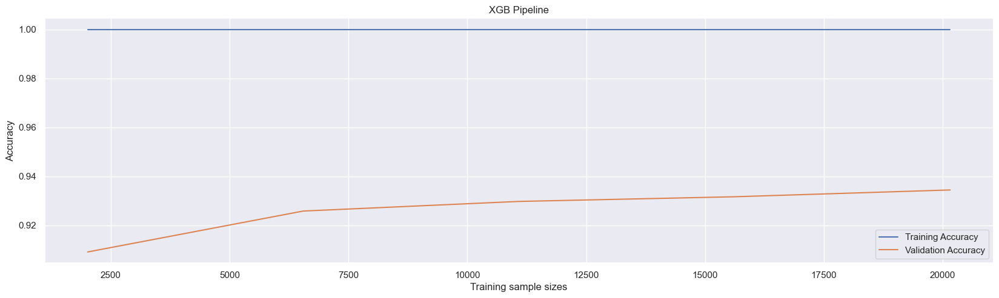

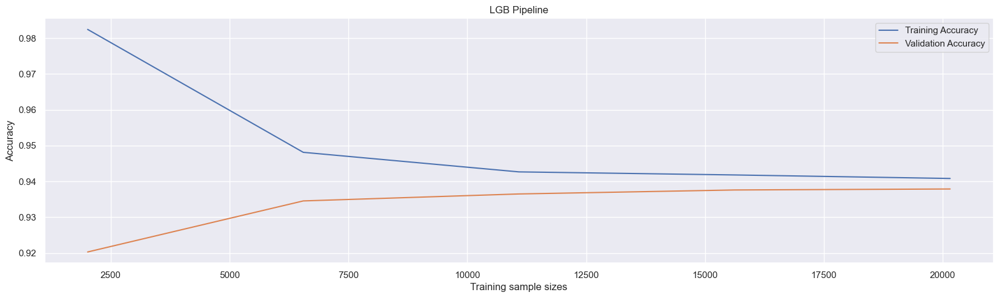

CPU times: total: 1.23 s
Wall time: 5min 21s


In [111]:
%%time
def funct_lc(be,X_train,y_train,title):
    a, b, c = learning_curve(be, X_train, y_train, n_jobs=-1, scoring='accuracy')
    plt.title(f"{title}")
    plt.plot(a, b.mean(axis=1), label='Training Accuracy')
    plt.plot(a, c.mean(axis=1),  label='Validation Accuracy')
    plt.xlabel('Training sample sizes')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()
    
funct_lc(be_xgb,X,y,"XGB Pipeline")
funct_lc(be_lgb,X,y,"LGB Pipeline")

[[4977   89]
 [ 355 1063]]

The Confusion Matrix for the XGB Pipeline:


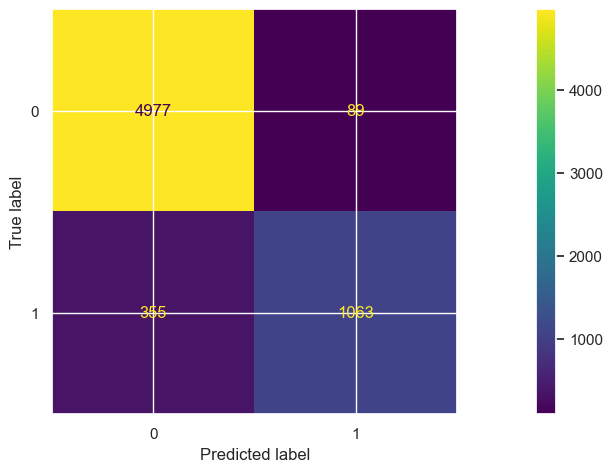


The Classification Report for the XGB Pipeline:
              precision    recall  f1-score   support

           0       0.93      0.98      0.96      5066
           1       0.92      0.75      0.83      1418

    accuracy                           0.93      6484
   macro avg       0.93      0.87      0.89      6484
weighted avg       0.93      0.93      0.93      6484


The Final Accuracy Score for the XGB Pipeline: 0.9315237507711289


[[5030   36]
 [ 402 1016]]

The Confusion Matrix for the LGB Pipeline:


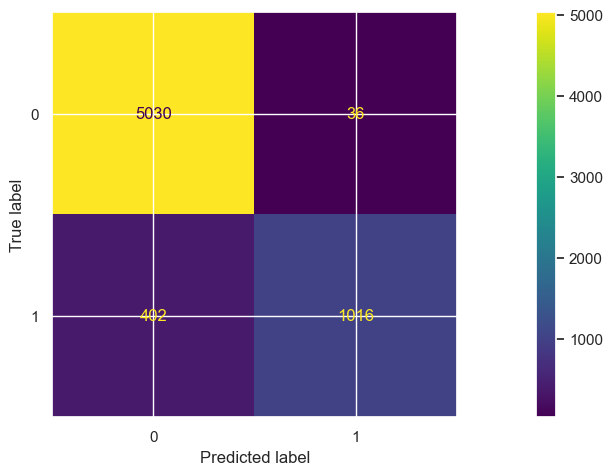


The Classification Report for the LGB Pipeline:
              precision    recall  f1-score   support

           0       0.93      0.99      0.96      5066
           1       0.97      0.72      0.82      1418

    accuracy                           0.93      6484
   macro avg       0.95      0.85      0.89      6484
weighted avg       0.93      0.93      0.93      6484


The Final Accuracy Score for the LGB Pipeline: 0.932449105490438




In [112]:
## Function for confusion matrix:
def funct_cm(be,X_test,y_test,preds,title):
    ## Simple Confusion Matrix:
    print(confusion_matrix(y_test, preds))
    
    print(f"\nThe Confusion Matrix for the {title}:")
    ## Plotting the Confusion Matrix:
    plot_confusion_matrix(be, X_test, y_test)
    plt.show()
    
    print(f"\nThe Classification Report for the {title}:")
    ## Classification Report:
    print(classification_report(y_test, preds))
    
    print(f"\nThe Final Accuracy Score for the {title}: {be.score(X_test, y_test)}")
    ## Accuracy Score
    print("\n")
    
funct_cm(be_xgb,X_test,y_test,preds_xgb,"XGB Pipeline")
funct_cm(be_lgb,X_test,y_test,preds_lgb,"LGB Pipeline")

In [113]:
print(f"The accuracy score of the XGB model is: {accuracy_score(y_test,preds_xgb)}!")
print(f"The accuracy score of the LGB model is: {accuracy_score(y_test,preds_lgb)}!")

The accuracy score of the XGB model is: 0.9315237507711289!
The accuracy score of the LGB model is: 0.932449105490438!


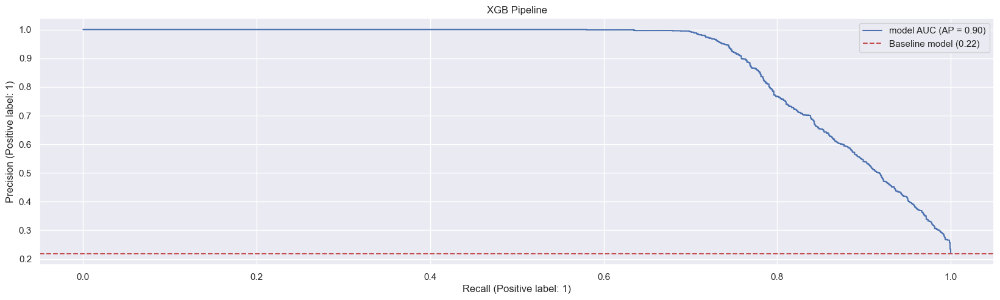

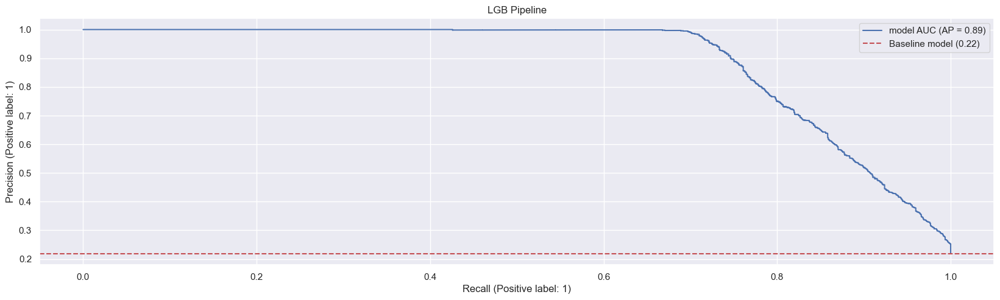

CPU times: total: 2.06 s
Wall time: 593 ms


In [114]:
%%time
def funct_pr(be,X_test,y_test,title):
    plot_precision_recall_curve(estimator=be, X=X_test, y=y_test, name='model AUC')
    baseline = y_test.sum() / len(y_test)
    plt.axhline(baseline, ls='--', color='r', label=f'Baseline model ({round(baseline,2)})')
    plt.title(f"{title}")
    plt.legend(loc='best')
    plt.show()
    
funct_pr(pipe_xgb,X_test,y_test,"XGB Pipeline")
funct_pr(pipe_lgb,X_test,y_test,"LGB Pipeline")

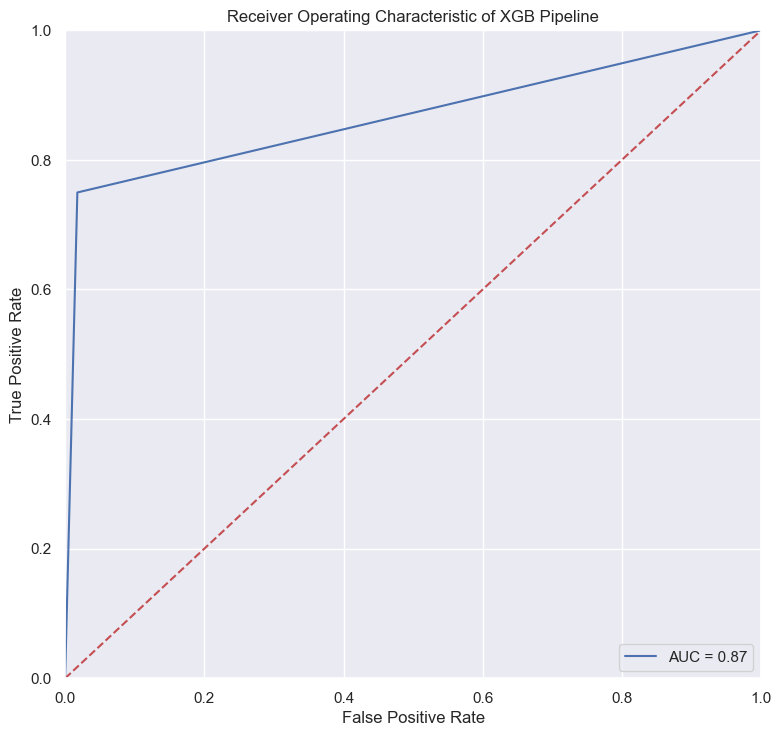

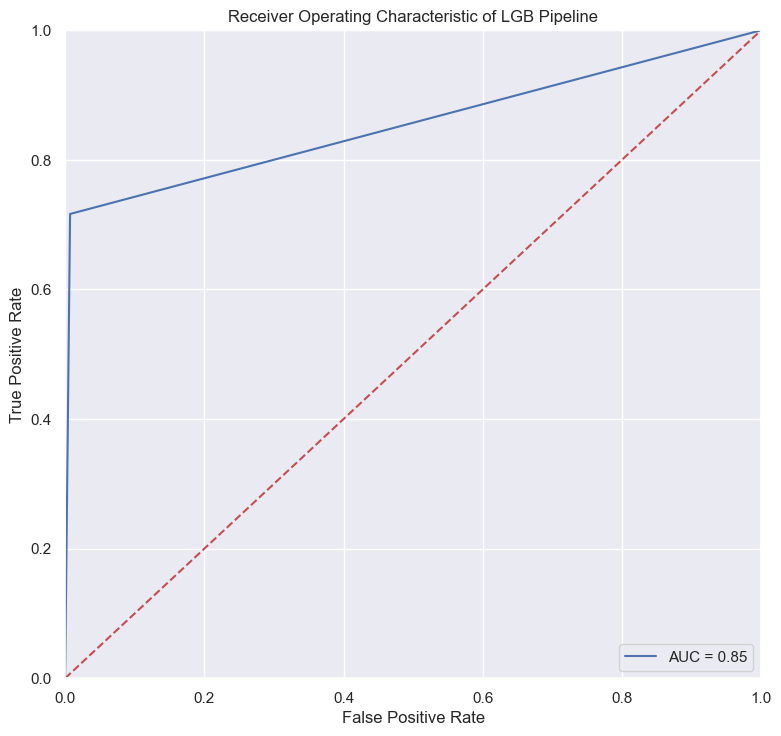

In [115]:
def funct_roc(y_test,preds,title):
    fpr, tpr, threshold = roc_curve(y_test, preds)
    roc_auc = auc(fpr, tpr)

    # method I: plt
    plt.figure(figsize=(8,8))
    plt.title(f'Receiver Operating Characteristic of {title}')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

#     # method II: ggplot
#     from ggplot import *
#     df = pd.DataFrame(dict(fpr = fpr, tpr = tpr))
#     ggplot(df, aes(x = 'fpr', y = 'tpr')) + geom_line() + geom_abline(linetype = 'dashed')
    
funct_roc(y_test,preds_xgb,"XGB Pipeline")
funct_roc(y_test,preds_lgb,"LGB Pipeline")   

In [116]:
print(f"The MCC score of XGB Pipeline is:{matthews_corrcoef(y_test, preds_xgb)}")
print(f"The MCC score of LGB Pipeline is:{matthews_corrcoef(y_test, preds_lgb)}")

The MCC score of XGB Pipeline is:0.7916943018607322
The MCC score of LGB Pipeline is:0.7953744618700234


FOR XGB PIPELINE:



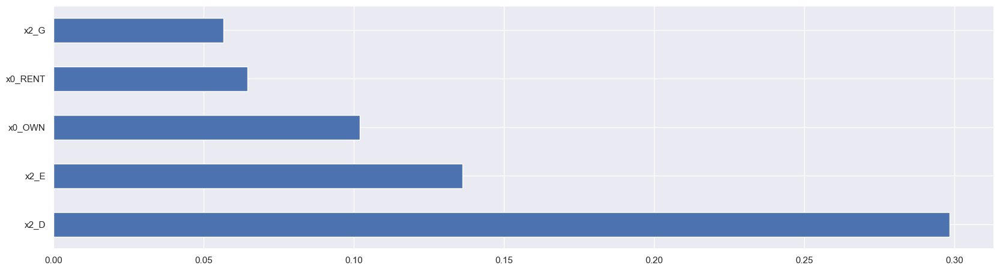


FOR LGBM PIPELINE:



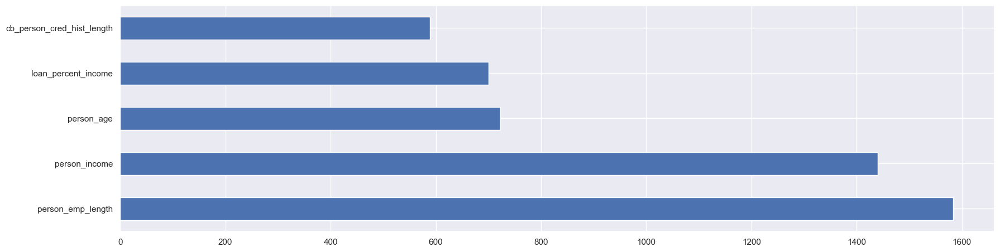

In [117]:
def funct_fi(p,cols):
    fi=p.steps[2][1].feature_importances_  ## Returns the list of feature importance from model inside the pipeline
    feat_importances = pd.Series(fi, index=cols)
    feat_importances.nlargest(5).plot(kind='barh')
    plt.show()
    
# Obtaining the names of the One Hot Encoded columns:
# Check the article for more information: https://medium.com/mlearning-ai/get-column-name-after-fitting-the-machine-learning-pipeline-145a2a8051cc
ccol=pipe_lgb.named_steps["coltf"].named_transformers_["cat_cols"].get_feature_names()
ncol=ncol.delete(ncol.get_loc("loan_status"))  ## ncol is an index object, not an array object
ncol=ncol.delete(ncol.get_loc("loan_int_rate"))
train_col=list(ncol)+list(ccol) ## Final list of columns

print("FOR XGB PIPELINE:\n")
funct_fi(pipe_xgb,train_col)
print("\nFOR LGBM PIPELINE:\n")
funct_fi(pipe_lgb,train_col)

In [118]:
# Save the ML Pipeline:
import joblib
joblib.dump(pipe_lgb, 'best_pipeline.pkl')

['best_pipeline.pkl']

In [119]:
X.person_home_ownership.unique()

array(['OWN', 'MORTGAGE', 'RENT', 'OTHER'], dtype=object)

In [120]:
# import joblib

# # Load the saved pipeline
# pipeline = joblib.load('best_pipeline.pkl')

# # Use the loaded pipeline for prediction
# predictions = pipeline.predict(X_test)